<a href="https://colab.research.google.com/github/BhanuSrihridai/Promilo_BA/blob/main/Promilo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations

import warnings
warnings.filterwarnings("ignore")

## Loading the data set

In [4]:
data=pd.read_excel("Promilo_BA.xlsx")
# data.head()

## Getting the list of sheets in the dataset

In [5]:
ex_Book=pd.ExcelFile("Promilo_BA.xlsx")
sheets=ex_Book.sheet_names
sheets

['Report Snapshot',
 'User Acquisition',
 'Traffic Aquisition',
 'Event Report',
 'Conversion Report',
 'Pages & Screens Report',
 'Retention Overview',
 'User Engagement Overview',
 'Demographics Report',
 'Citywise Report',
 'Gender Report',
 'User By Interest',
 'User by Language',
 'User By Age',
 'Google Ads Report']

## Exploring each sheet

### 1. Report Snapshot

In [6]:
data_report_snap=pd.read_excel("Promilo_BA.xlsx",sheet_name='Report Snapshot')

In [7]:
data_report_snap

""


This sheet contains no data except a picture.

### 2. User Acquisition

In [8]:
data_user_aqs=pd.read_excel("Promilo_BA.xlsx",sheet_name='User Acquisition')
data_user_aqs

,First user default channel group,New users,Engaged sessions,Engagement rate,Engaged sessions per user,Average engagement time,Event count,Conversions,Total revenue
0,Display,9957,12008,0.544457,1.206107,58.86209,204820,37434,0
1,Organic Search,7652,18141,0.813680,2.367041,534.31280,770710,109801,0
2,Paid Search,3025,4408,0.474284,1.458154,102.23780,81997,14770,0
3,Direct,1903,4975,0.318808,2.261364,1128.88100,227434,31093,0
4,Unassigned,325,1619,0.813159,4.981538,798.34150,33320,789,0
5,Organic Social,10,13,0.722222,1.300000,145.30000,248,27,0


In [9]:
data_user_aqs.style.bar(cmap='icefire',height=50,width=55) # Adding internal bar charts to numerical columns for a sample of the data

,First user default channel group,New users,Engaged sessions,Engagement rate,Engaged sessions per user,Average engagement time,Event count,Conversions,Total revenue
0,Display,9957,12008,0.544457,1.206107,58.862090,204820,37434,0
1,Organic Search,7652,18141,0.813680,2.367041,534.312800,770710,109801,0
2,Paid Search,3025,4408,0.474284,1.458154,102.237800,81997,14770,0
3,Direct,1903,4975,0.318808,2.261364,1128.881000,227434,31093,0
4,Unassigned,325,1619,0.813159,4.981538,798.341500,33320,789,0
5,Organic Social,10,13,0.722222,1.300000,145.300000,248,27,0


In [10]:
data_user_aqs.shape

(6, 9)

In [11]:
data_user_aqs.describe().T

,count,mean,std,min,25%,50%,75%,max
New users,6.0,3812.000000,4083.739659,10.000000,719.500000,2464.000000,6495.250000,9957.000000
Engaged sessions,6.0,6860.666667,6894.604867,13.000000,2316.250000,4691.500000,10249.750000,18141.000000
Engagement rate,6.0,0.614435,0.201367,0.318808,0.491827,0.633339,0.790425,0.813680
Engaged sessions per user,6.0,2.262367,1.420806,1.206107,1.339538,1.859759,2.340622,4.981538
Average engagement time,6.0,461.322532,437.111008,58.862090,113.003350,339.806400,732.334325,1128.881000
Event count,6.0,219754.833333,284869.104021,248.000000,45489.250000,143408.500000,221780.500000,770710.000000
Conversions,6.0,32319.000000,40929.227185,27.000000,4284.250000,22931.500000,35848.750000,109801.000000
Total revenue,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [12]:
data_user_aqs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 9 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   First user default channel group  6 non-null      object 
 1   New users                         6 non-null      int64  
 2   Engaged sessions                  6 non-null      int64  
 3   Engagement rate                   6 non-null      float64
 4   Engaged sessions per user         6 non-null      float64
 5   Average engagement time           6 non-null      float64
 6   Event count                       6 non-null      int64  
 7   Conversions                       6 non-null      int64  
 8   Total revenue                     6 non-null      int64  
dtypes: float64(3), int64(5), object(1)
memory usage: 560.0+ bytes


In [13]:
data_user_aqs.duplicated().sum()

0

In [14]:
def columns(data):

  cols=data.columns                                              # Retreiving the columns of the data frame
  cat_cols=data.select_dtypes(include='object').columns          # Retreiving the categorical columns
  numeric_cols=data.select_dtypes(include='number').columns      # Retreiving the continuous/numerical columns
  return numeric_cols,cat_cols

In [15]:
def scatter_and_reg_plots(data,x,y):

  fig,axes=plt.subplots(2,1,figsize=(15,10))
  plt.subplots_adjust(hspace=0.5)

  fig1=sns.scatterplot(data=data,x=x,y=y,palette='magma',ax=axes[0]).set_title(f"Scatter plot of {x} vs {y}",fontweight='bold',fontsize=20)
  fig2=sns.regplot(data=data,x=x,y=y,color='orange',scatter_kws={"facecolors": "blue",'s':50,'edgecolor':'blue'},ax=axes[1]).set_title(f"Regression plot of {x} & {y}",fontweight='bold',fontsize=20)



In [16]:
numeric_cols,cat_cols=columns(data_user_aqs)
combis=list(combinations(numeric_cols,2))
combis

[('New users', 'Engaged sessions'),
 ('New users', 'Engagement rate'),
 ('New users', 'Engaged sessions per user'),
 ('New users', 'Average engagement time'),
 ('New users', 'Event count'),
 ('New users', 'Conversions'),
 ('New users', 'Total revenue'),
 ('Engaged sessions', 'Engagement rate'),
 ('Engaged sessions', 'Engaged sessions per user'),
 ('Engaged sessions', 'Average engagement time'),
 ('Engaged sessions', 'Event count'),
 ('Engaged sessions', 'Conversions'),
 ('Engaged sessions', 'Total revenue'),
 ('Engagement rate', 'Engaged sessions per user'),
 ('Engagement rate', 'Average engagement time'),
 ('Engagement rate', 'Event count'),
 ('Engagement rate', 'Conversions'),
 ('Engagement rate', 'Total revenue'),
 ('Engaged sessions per user', 'Average engagement time'),
 ('Engaged sessions per user', 'Event count'),
 ('Engaged sessions per user', 'Conversions'),
 ('Engaged sessions per user', 'Total revenue'),
 ('Average engagement time', 'Event count'),
 ('Average engagement time

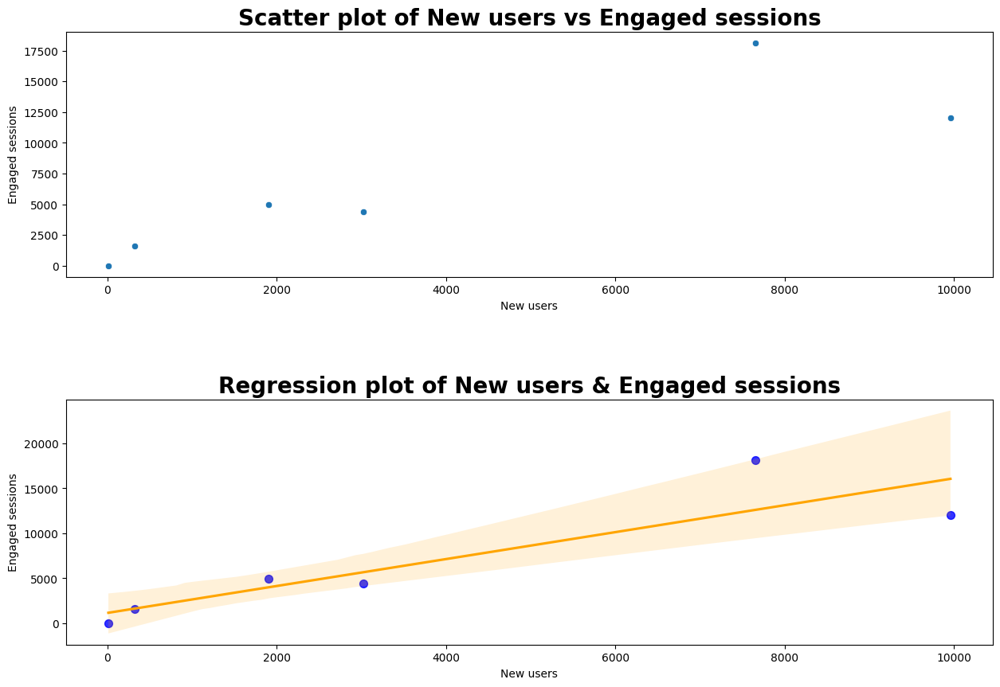

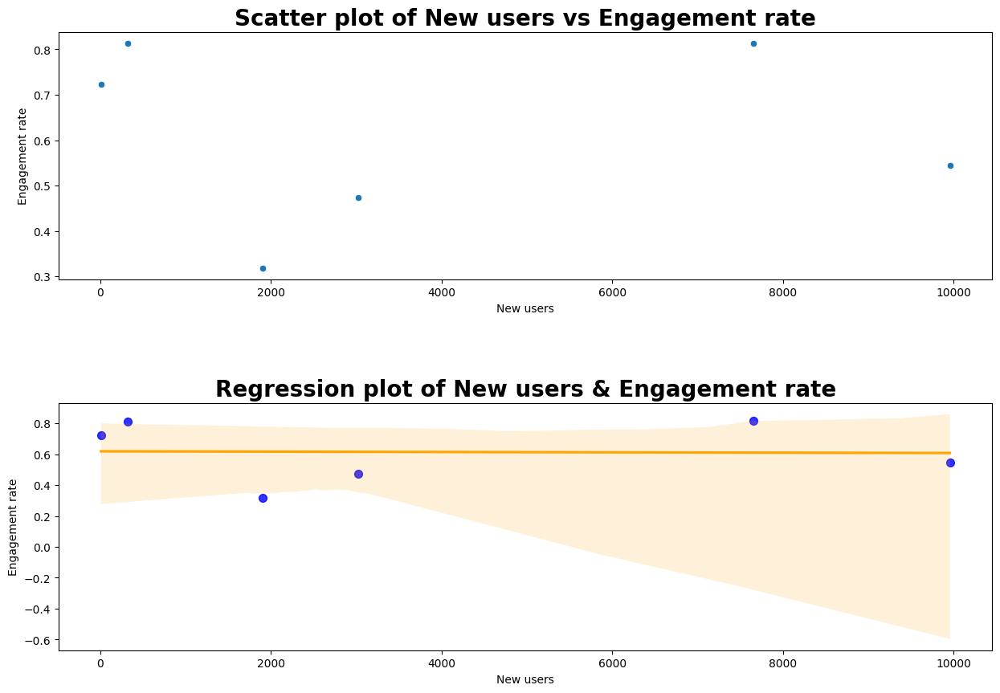

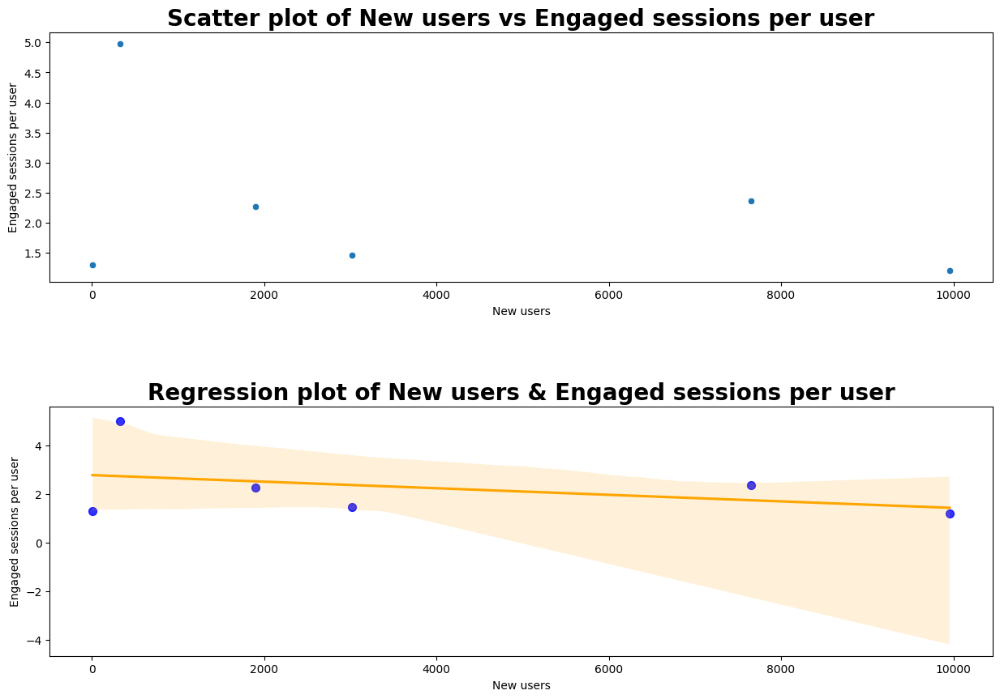

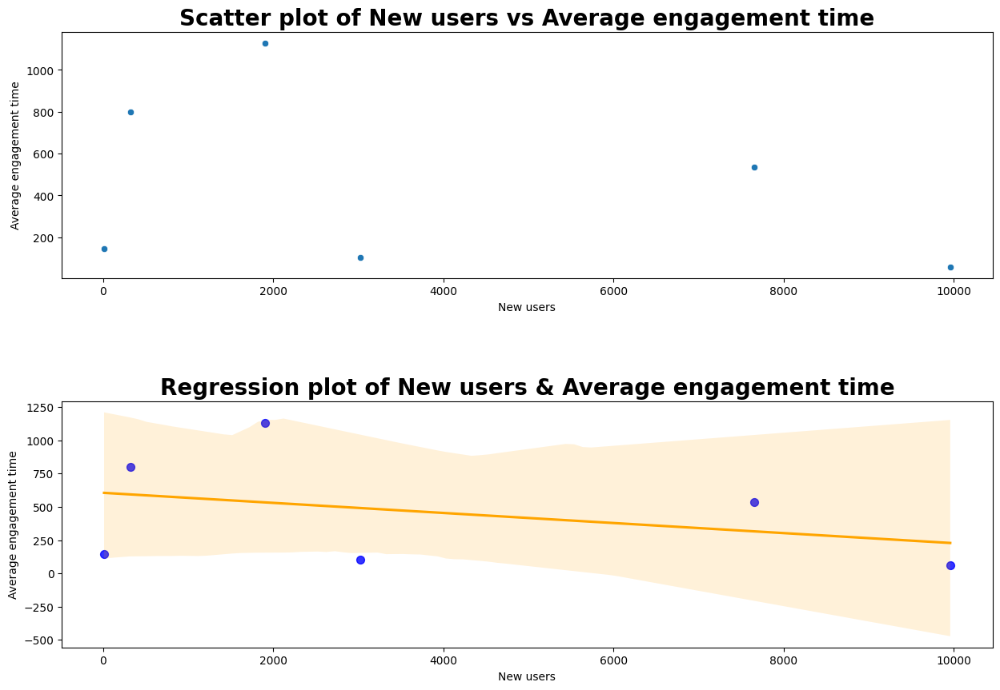

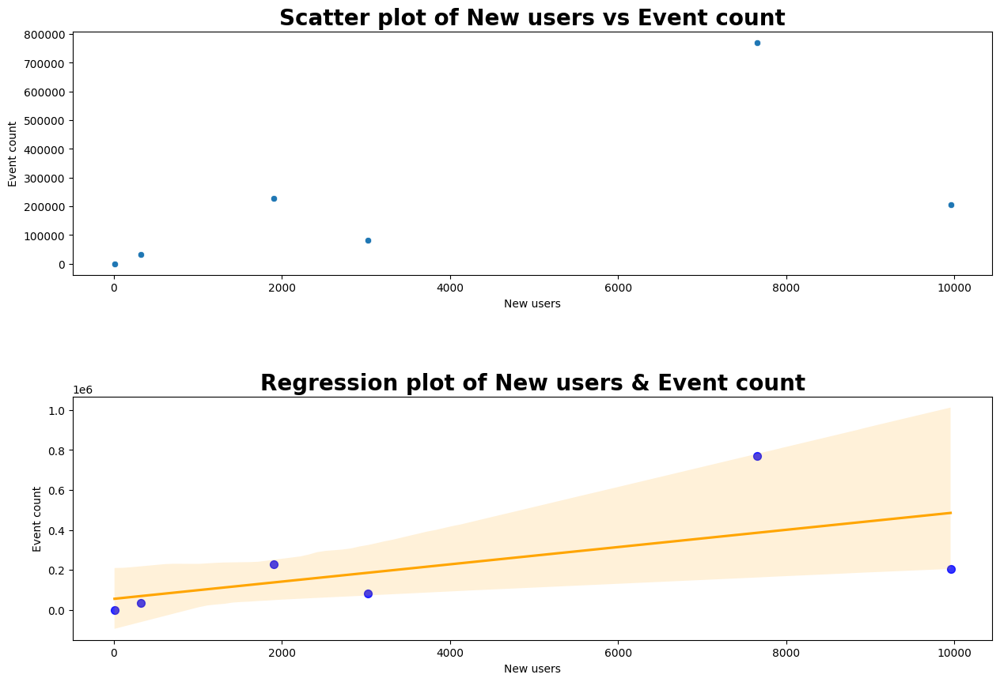

...

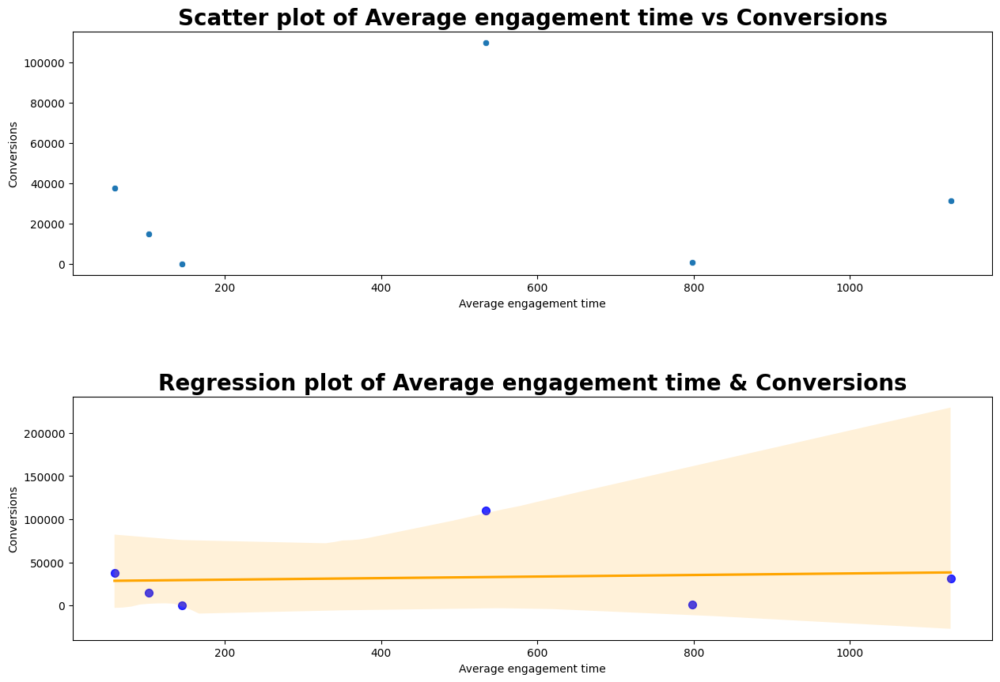

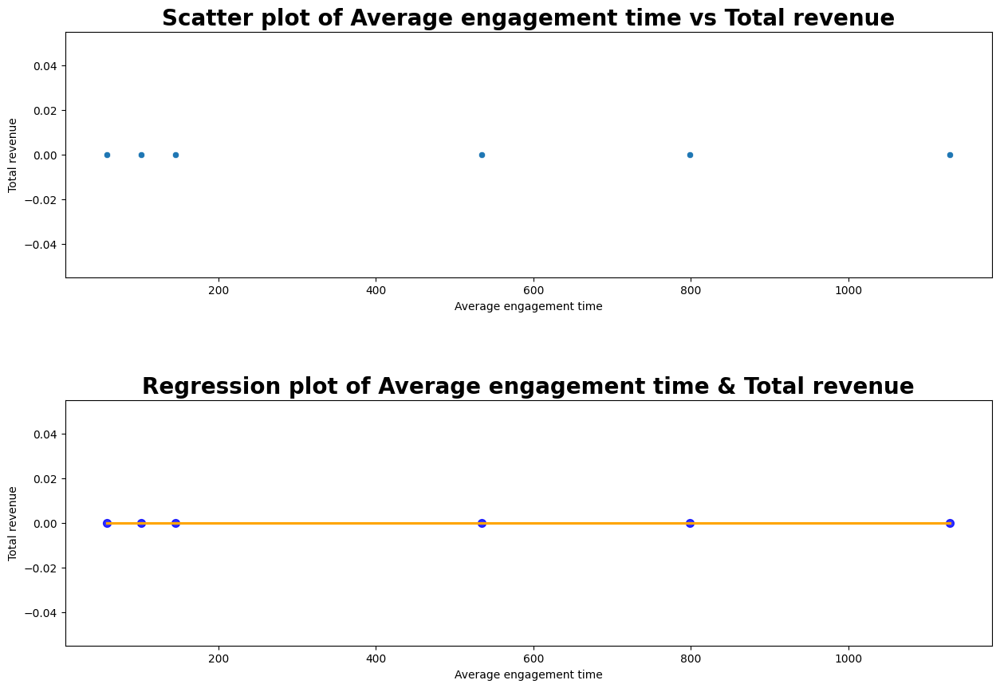

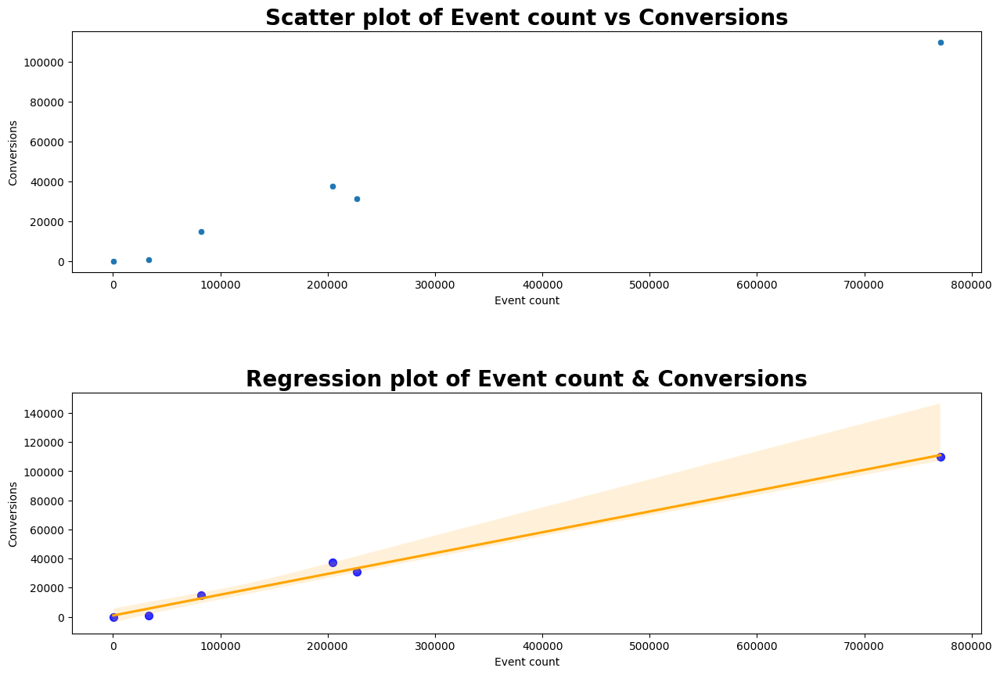

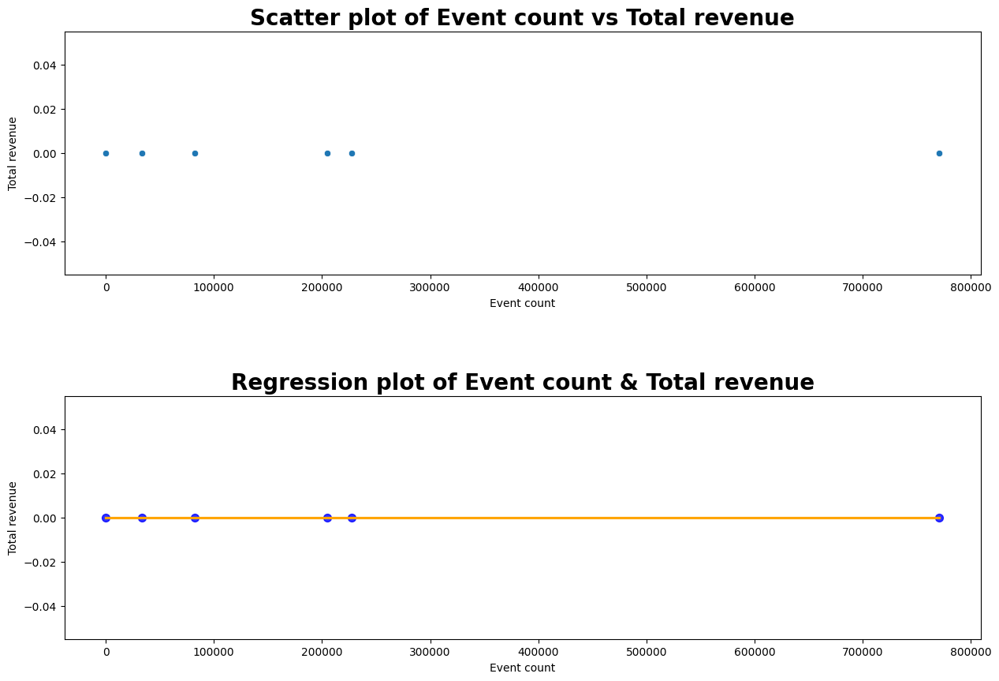

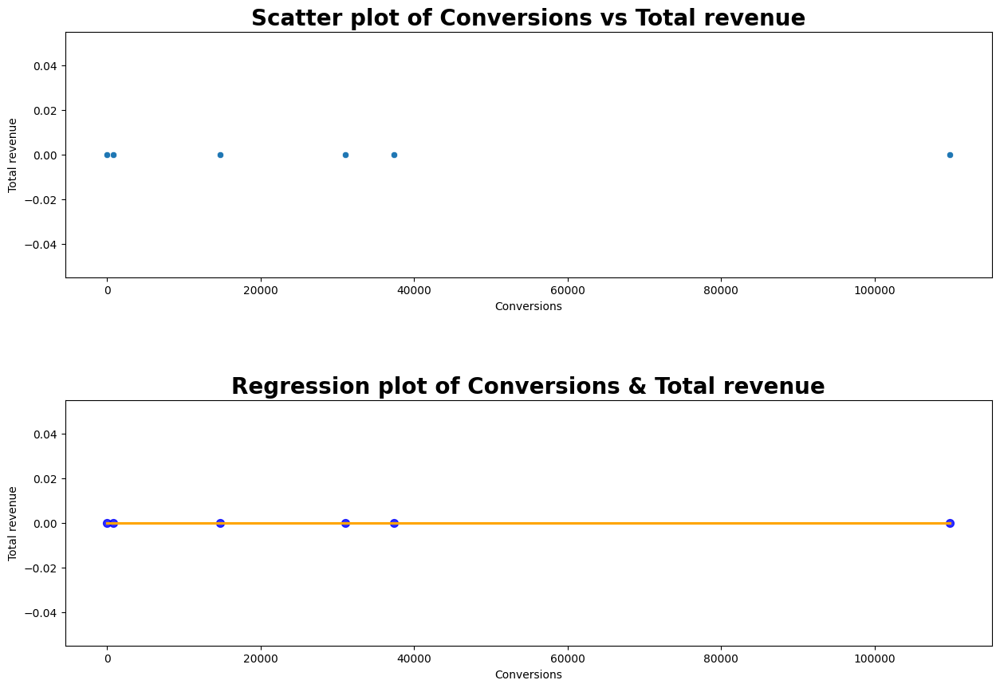

In [17]:
for x in combis:
  scatter_and_reg_plots(data_user_aqs,x[0],x[1])

In [18]:
def bar_plot(data,x,y): # x-continuous variable, y-categorical variable

  plt.figure(figsize=(10,3))
  plt.title(f"Barplot of {y} & {x}",pad=25,fontweight='bold')

  fig=sns.barplot(data=data.sort_values(by=x),x=x,y=y,palette='rocket')
  fig.bar_label(fig.containers[0],fontweight='bold',padding=5)       # Setting bar labels
  fig.spines[['right','top','bottom']].set_visible(False)            # Removing the chart junk
  fig.xaxis.set_visible(False)                                       # Hiding the x-axis

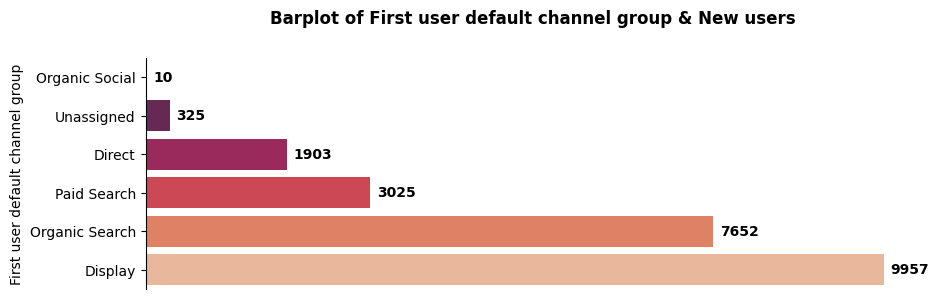

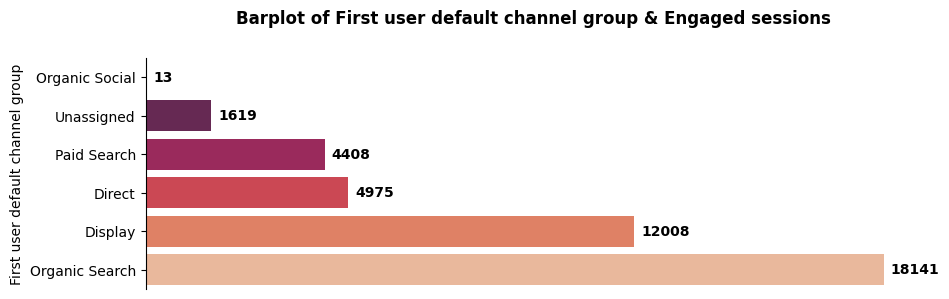

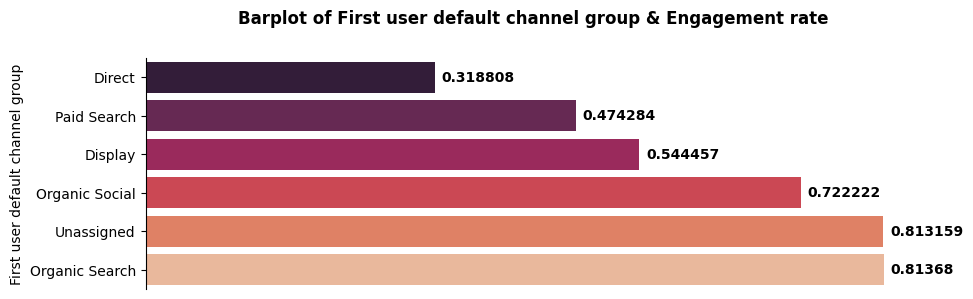

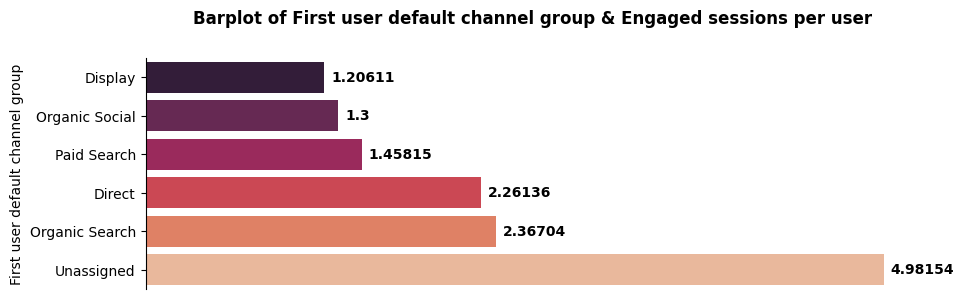

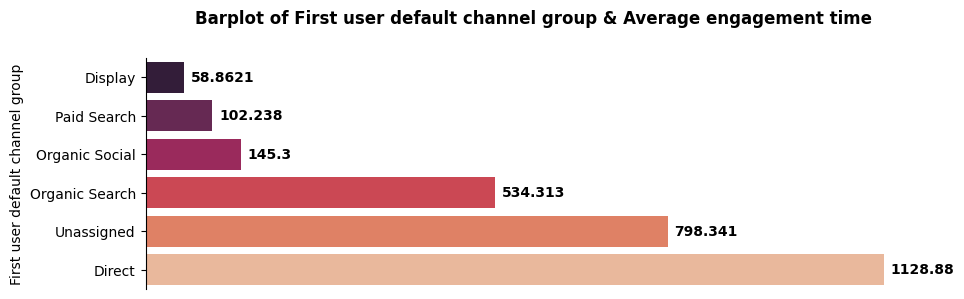

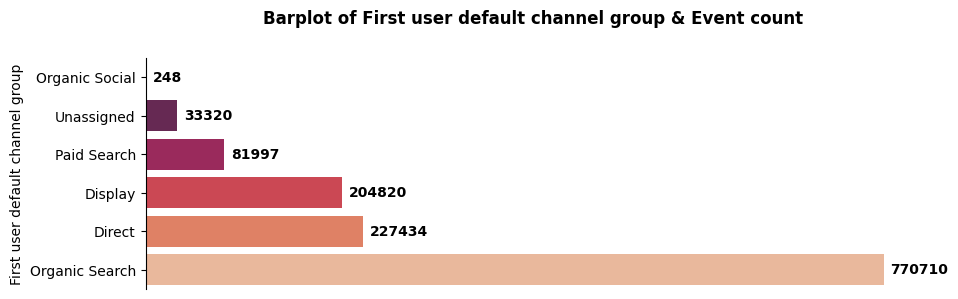

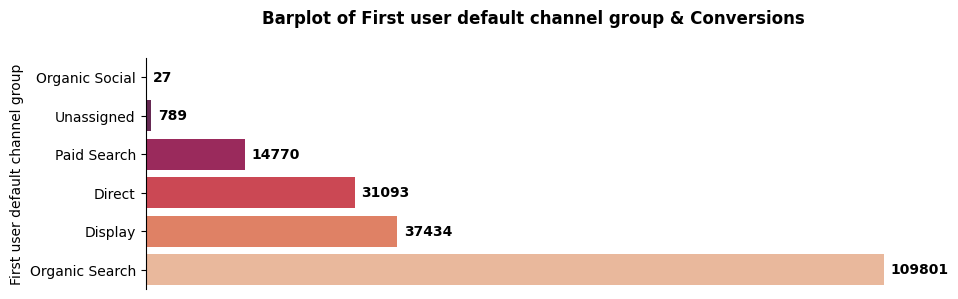

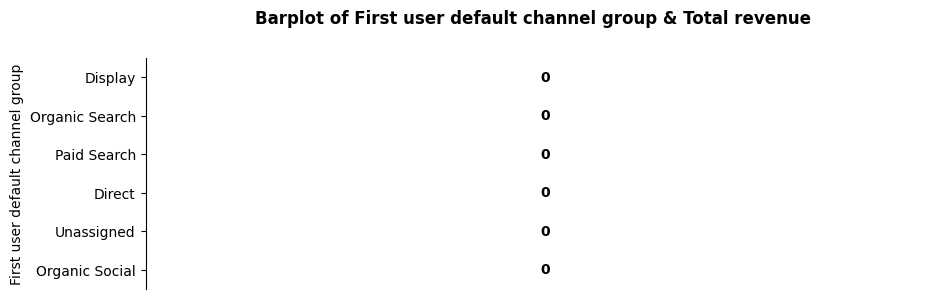

In [19]:
for x in numeric_cols:
  bar_plot(data_user_aqs,x,"First user default channel group")

In [20]:
correlation_matrix=data_user_aqs[['New users','Engaged sessions','Engagement rate','Engaged sessions per user','Average engagement time','Event count','Conversions']].corr()

<Axes: title={'center': 'Heatmap of correlation score of columns in User acquistion'}>

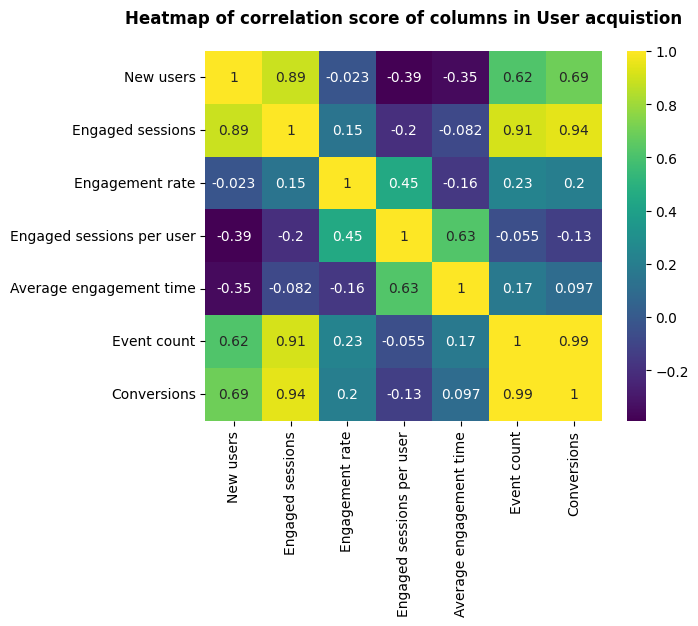

In [21]:
plt.title("Heatmap of correlation score of columns in User acquistion",pad=20,fontweight='bold')
sns.heatmap(data=correlation_matrix,annot=True,cmap='viridis')

**Good correlation score is observed between New users & Engaged sessions, Engaged sessions & Event count, Engaged sessions & Conversions and Event count & Conversions.**

In [22]:
def hist_and_box_plots(data,x):
  fig,axes=plt.subplots(1,2,figsize=(30,7))

  sns.boxplot(data=data,x=x,palette='rocket',ax=axes[0]).set_title(f"Box plot of {x}",fontweight='bold',fontsize=20)
  sns.histplot(data=data,x=x,palette='seismic_r',kde=True,ax=axes[1]).set_title(f"Histogram of {x} Column",fontweight='bold',fontsize=20)

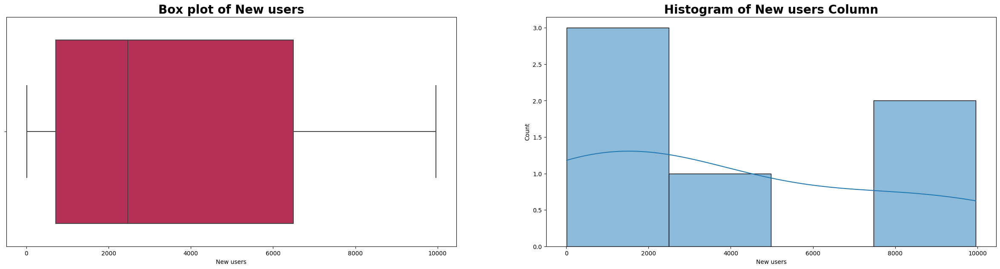

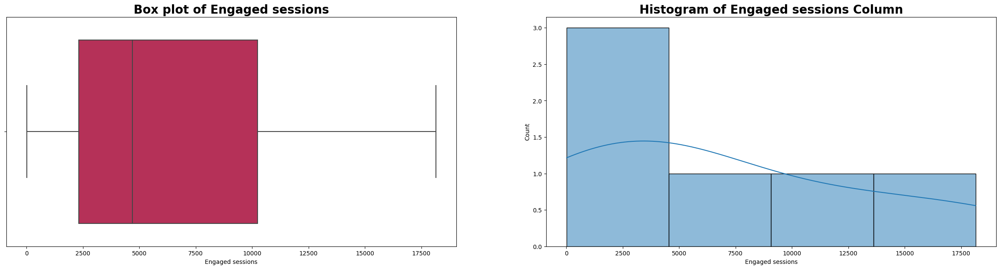

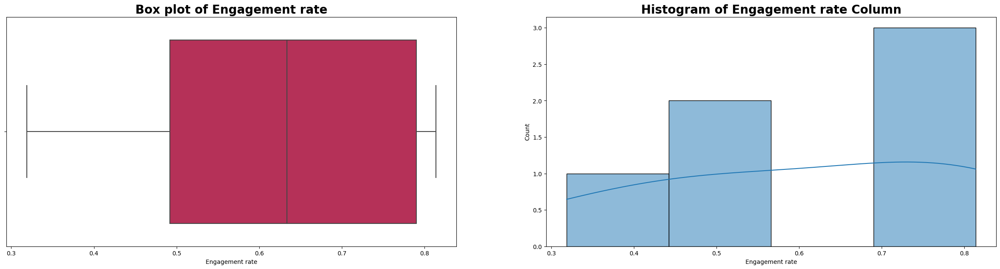

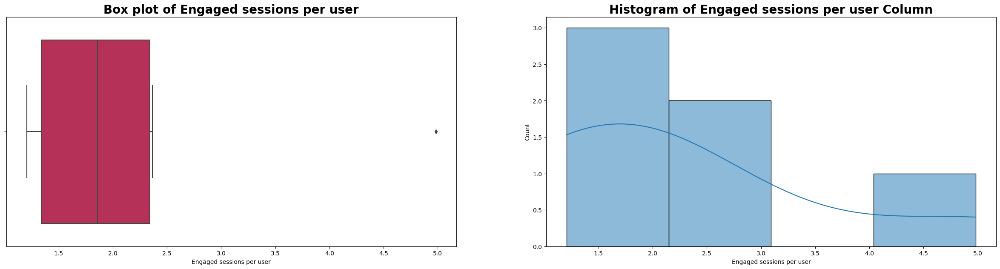

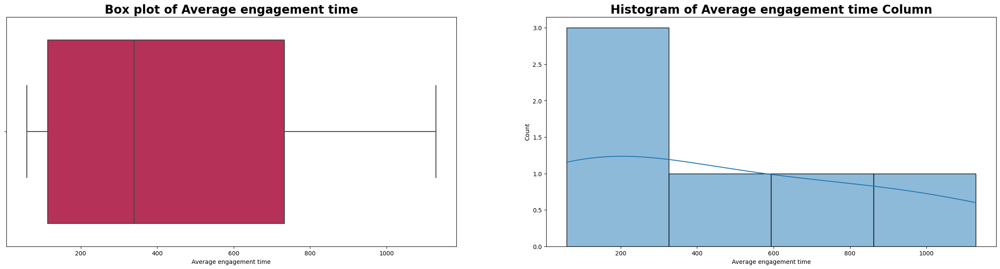

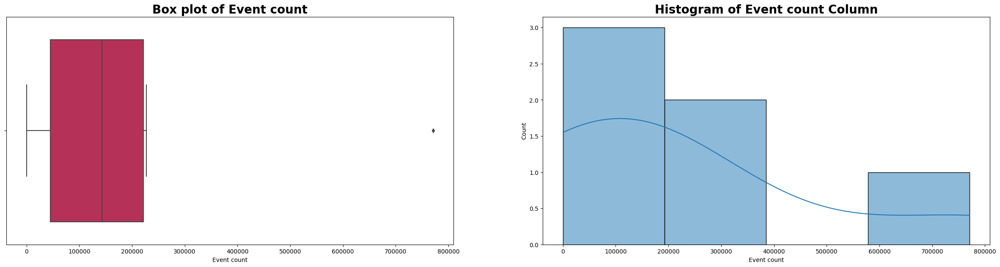

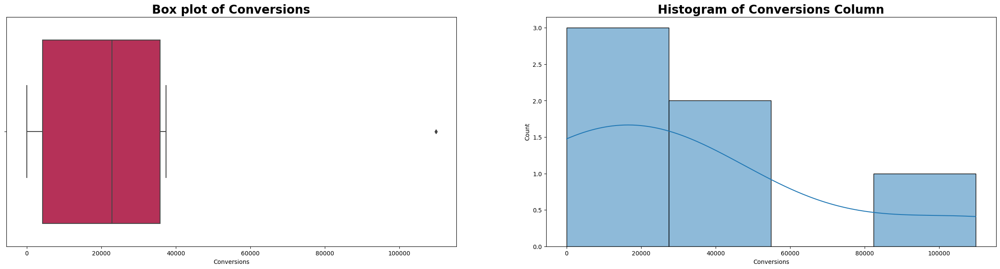

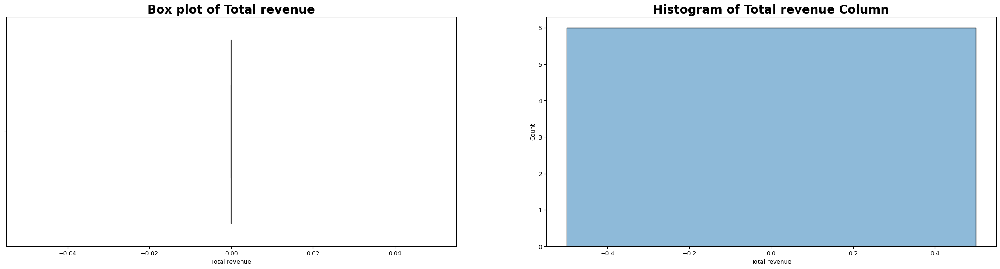

In [23]:
for x in numeric_cols:
  hist_and_box_plots(data_user_aqs,x)

**Outliers are observed in the following columns:** Engages sessions per user, Event count, Conversions

### 3. Traffic Acquisition

In [24]:
data_traffic_aqs=pd.read_excel("Promilo_BA.xlsx",sheet_name='Traffic Aquisition')
data_traffic_aqs

,Session default channel group,Users,Sessions,Engaged sessions,Average engagement time per session,Engaged sessions per user,Events per session,Engagement rate,Event count,Conversions,Total revenue
0,Unassigned,20263,13448,1481,34.11704,0.073089,18.023130,0.110128,242375,114161,0
1,Display,9613,18292,10613,28.52198,1.104026,9.069320,0.580199,165896,20031,0
2,Organic Search,7689,21241,17814,195.94340,2.316816,29.302290,0.838661,622410,33612,0
3,Direct,4042,13220,7649,177.17060,1.892380,17.135850,0.578593,226536,18496,0
4,Paid Search,2909,6788,3452,36.65321,1.186662,8.989982,0.508544,61024,7595,0
5,Organic Social,11,16,12,60.06250,1.090909,18.000000,0.750000,288,19,0


In [25]:
data_traffic_aqs.style.bar(cmap='coolwarm',height=50,width=55) # Adding internal bar charts to numerical columns for a sample of the data


,Session default channel group,Users,Sessions,Engaged sessions,Average engagement time per session,Engaged sessions per user,Events per session,Engagement rate,Event count,Conversions,Total revenue
0,Unassigned,20263,13448,1481,34.117040,0.073089,18.023130,0.110128,242375,114161,0
1,Display,9613,18292,10613,28.521980,1.104026,9.069320,0.580199,165896,20031,0
2,Organic Search,7689,21241,17814,195.943400,2.316816,29.302290,0.838661,622410,33612,0
3,Direct,4042,13220,7649,177.170600,1.892380,17.135850,0.578593,226536,18496,0
4,Paid Search,2909,6788,3452,36.653210,1.186662,8.989982,0.508544,61024,7595,0
5,Organic Social,11,16,12,60.062500,1.090909,18.000000,0.750000,288,19,0


In [26]:
data_traffic_aqs.shape

(6, 11)

In [27]:
data_traffic_aqs.describe().T

,count,mean,std,min,25%,50%,75%,max
Users,6.0,7421.166667,7162.088199,11.000000,3192.250000,5865.500000,9132.000000,20263.000000
Sessions,6.0,12167.500000,7735.416104,16.000000,8396.000000,13334.000000,17081.000000,21241.000000
Engaged sessions,6.0,6836.833333,6665.397735,12.000000,1973.750000,5550.500000,9872.000000,17814.000000
Average engagement time per session,6.0,88.744788,76.756564,28.521980,34.751083,48.357855,147.893575,195.943400
Engaged sessions per user,6.0,1.277314,0.772272,0.073089,1.094188,1.145344,1.715950,2.316816
Events per session,6.0,16.753429,7.484689,8.989982,11.085952,17.567925,18.017347,29.302290
Engagement rate,6.0,0.561021,0.252797,0.110128,0.526056,0.579396,0.707550,0.838661
Event count,6.0,219754.833333,218609.598013,288.000000,87242.000000,196216.000000,238415.250000,622410.000000
Conversions,6.0,32319.000000,41704.726979,19.000000,10320.250000,19263.500000,30216.750000,114161.000000
Total revenue,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [28]:
data_traffic_aqs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 11 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Session default channel group        6 non-null      object 
 1   Users                                6 non-null      int64  
 2   Sessions                             6 non-null      int64  
 3   Engaged sessions                     6 non-null      int64  
 4   Average engagement time per session  6 non-null      float64
 5   Engaged sessions per user            6 non-null      float64
 6   Events per session                   6 non-null      float64
 7   Engagement rate                      6 non-null      float64
 8   Event count                          6 non-null      int64  
 9   Conversions                          6 non-null      int64  
 10  Total revenue                        6 non-null      int64  
dtypes: float64(4), int64(6), object(1)
m

In [29]:
data_traffic_aqs.duplicated().sum()

0

In [30]:
numeric_cols,cat_cols=columns(data_traffic_aqs)

In [31]:
combis=list(combinations(numeric_cols,2))
combis

[('Users', 'Sessions'),
 ('Users', 'Engaged sessions'),
 ('Users', 'Average engagement time per session'),
 ('Users', 'Engaged sessions per user'),
 ('Users', 'Events per session'),
 ('Users', 'Engagement rate'),
 ('Users', 'Event count'),
 ('Users', 'Conversions'),
 ('Users', 'Total revenue'),
 ('Sessions', 'Engaged sessions'),
 ('Sessions', 'Average engagement time per session'),
 ('Sessions', 'Engaged sessions per user'),
 ('Sessions', 'Events per session'),
 ('Sessions', 'Engagement rate'),
 ('Sessions', 'Event count'),
 ('Sessions', 'Conversions'),
 ('Sessions', 'Total revenue'),
 ('Engaged sessions', 'Average engagement time per session'),
 ('Engaged sessions', 'Engaged sessions per user'),
 ('Engaged sessions', 'Events per session'),
 ('Engaged sessions', 'Engagement rate'),
 ('Engaged sessions', 'Event count'),
 ('Engaged sessions', 'Conversions'),
 ('Engaged sessions', 'Total revenue'),
 ('Average engagement time per session', 'Engaged sessions per user'),
 ('Average engagemen

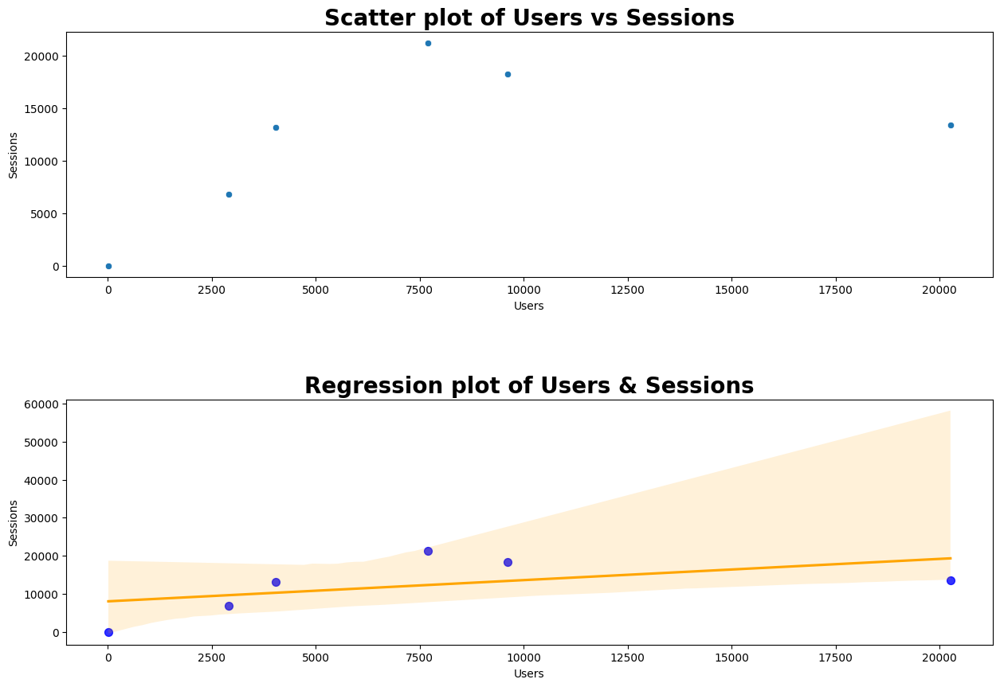

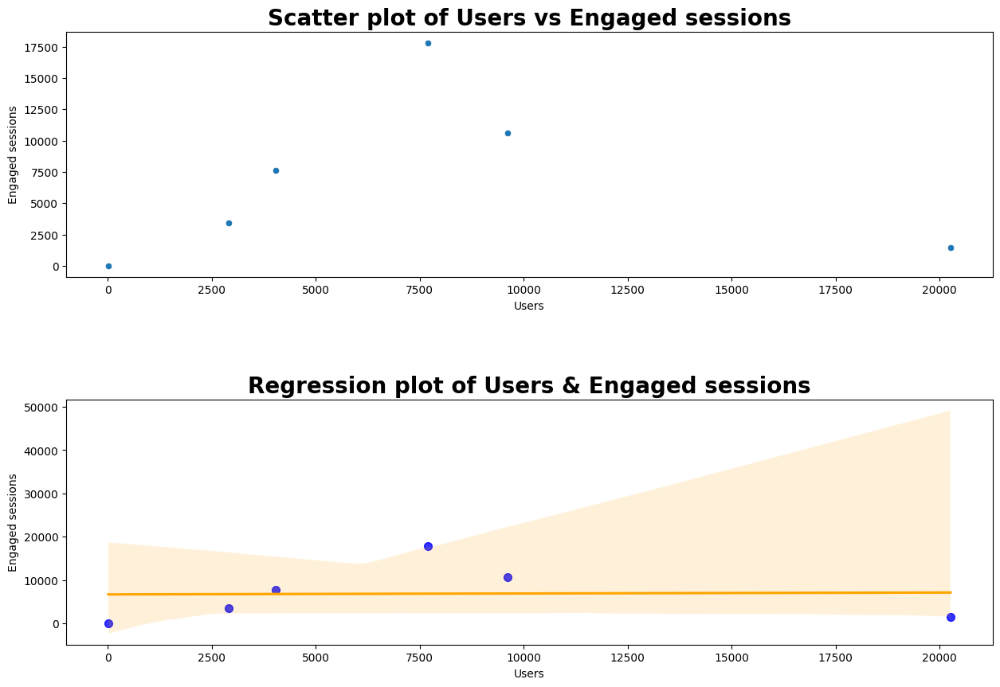

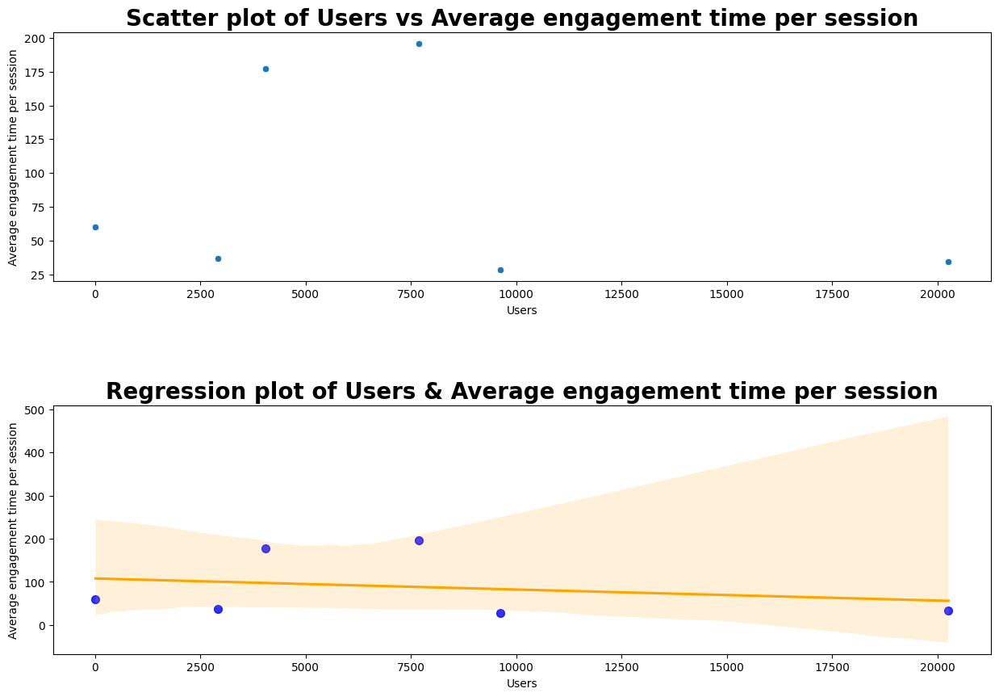

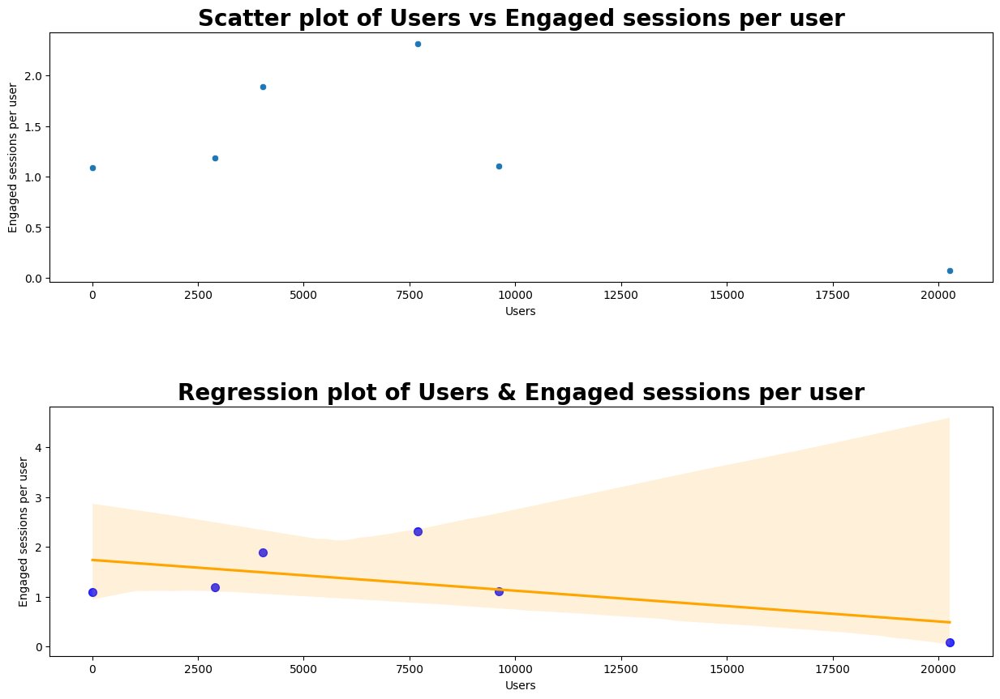

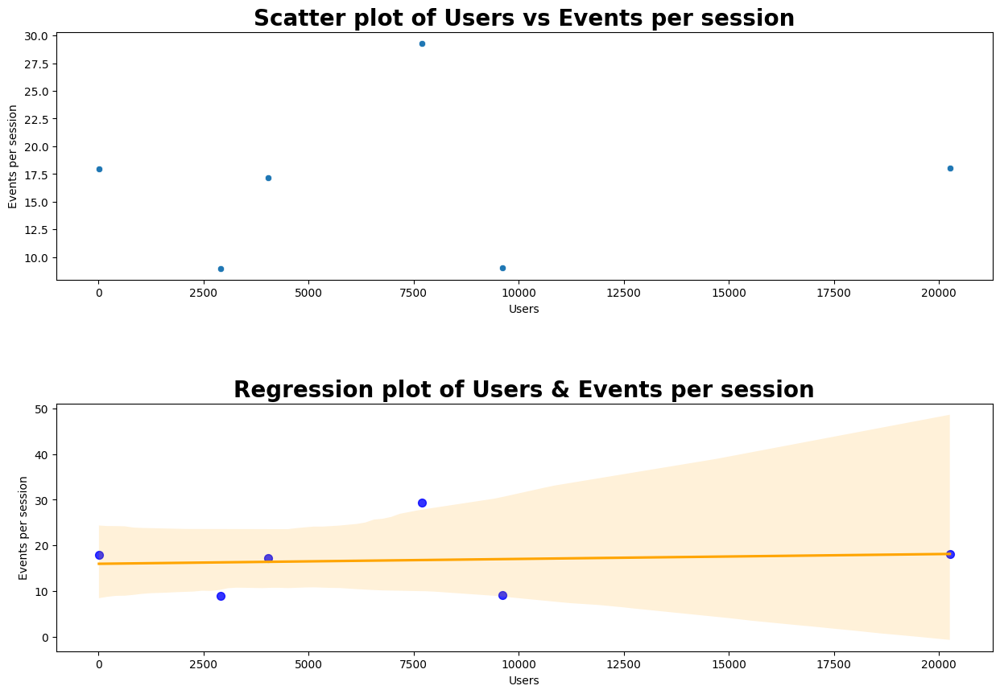

...

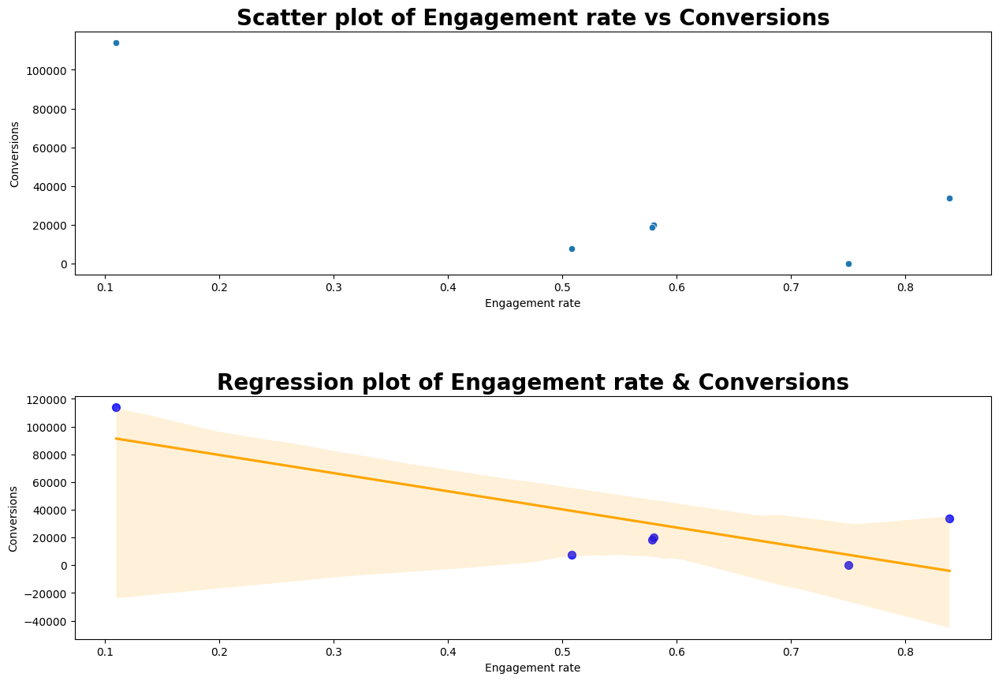

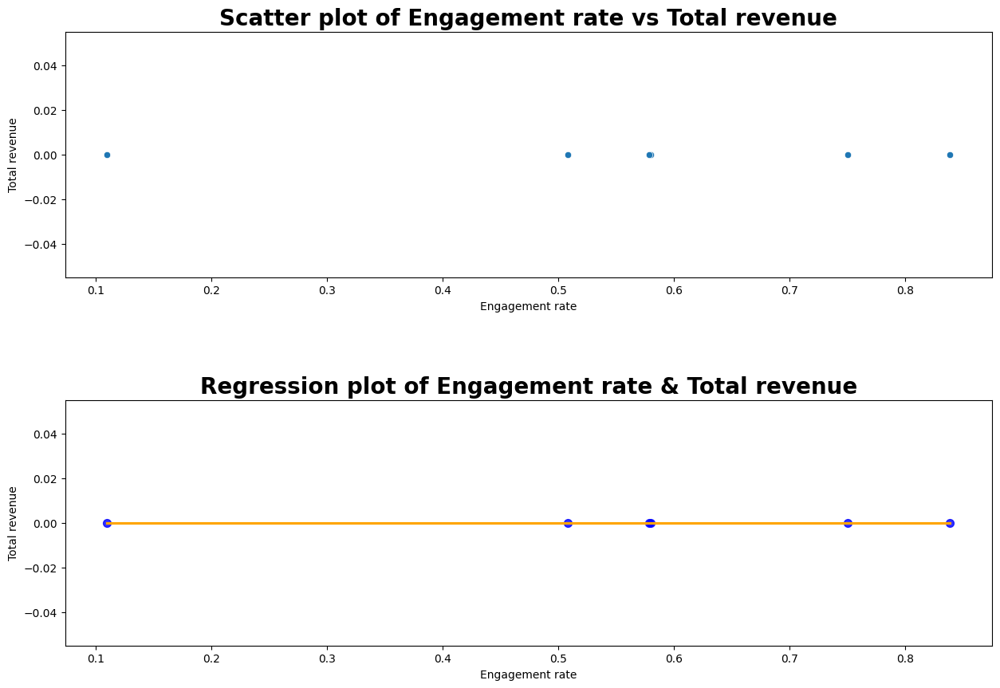

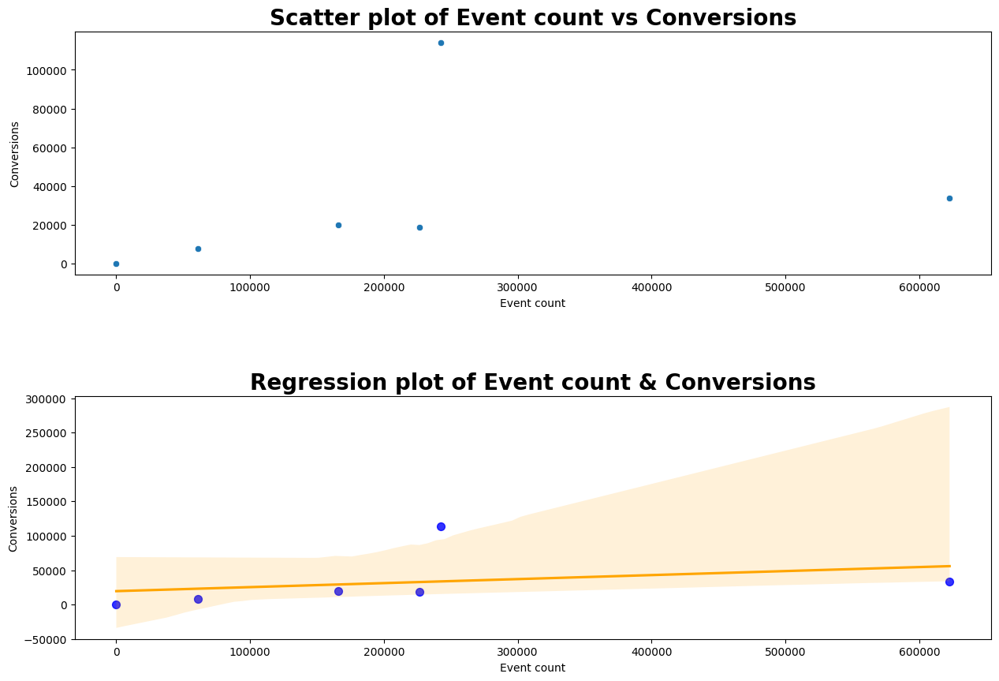

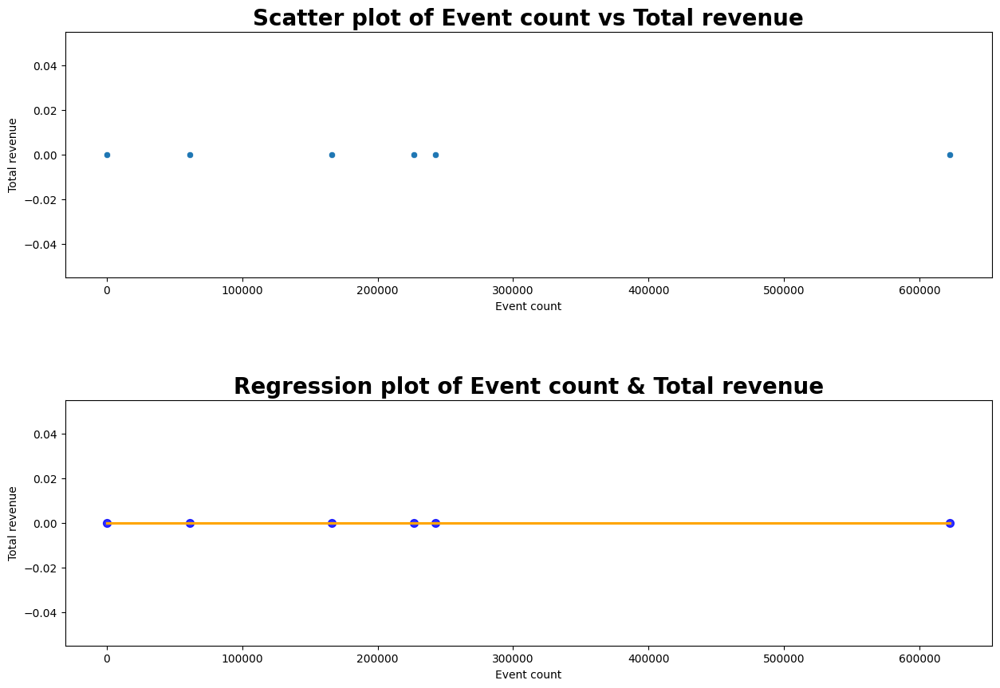

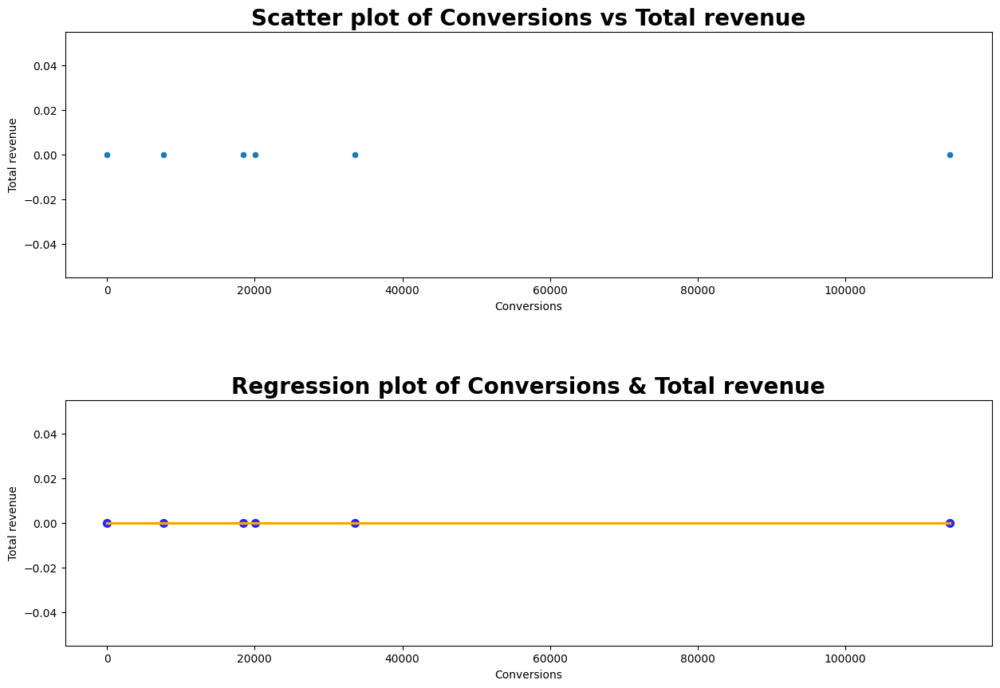

In [32]:
for x in combis:
  scatter_and_reg_plots(data_traffic_aqs,x[0],x[1])

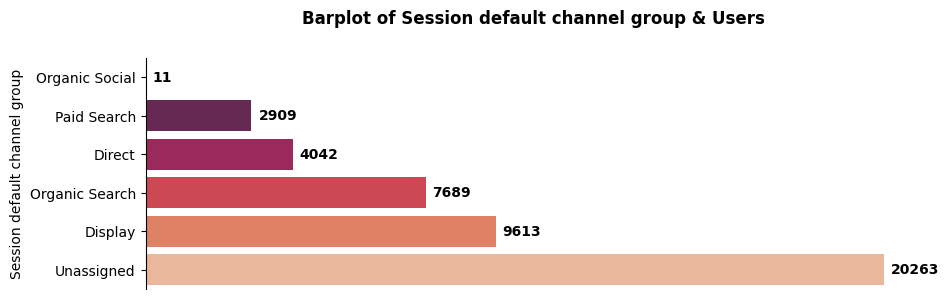

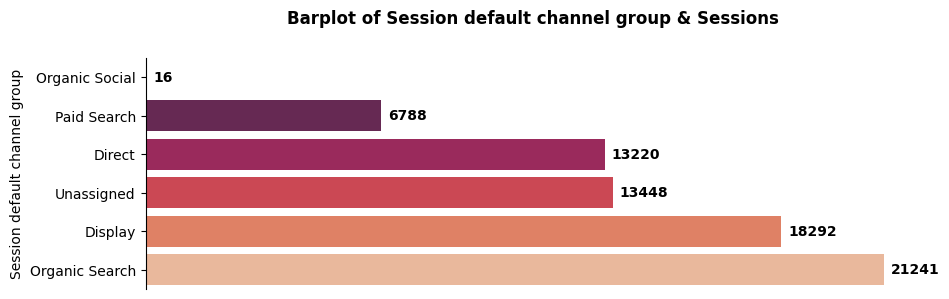

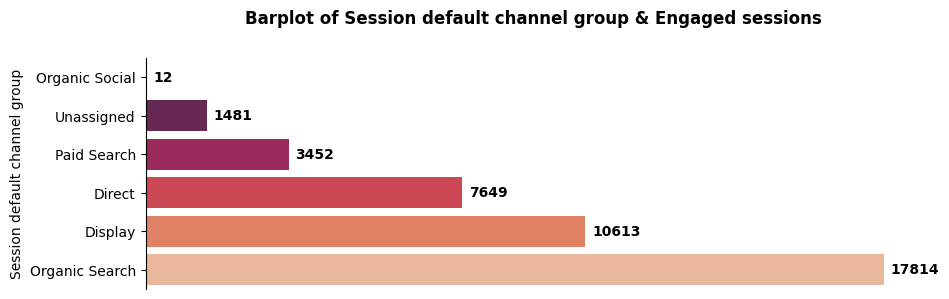

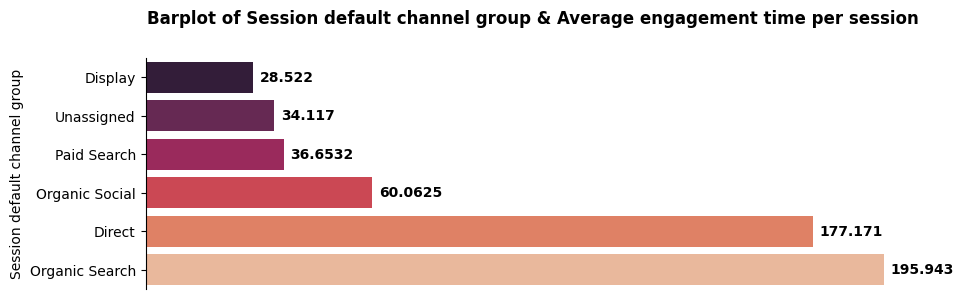

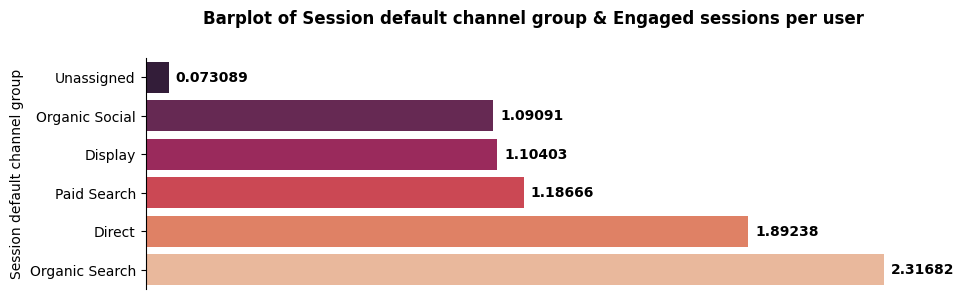

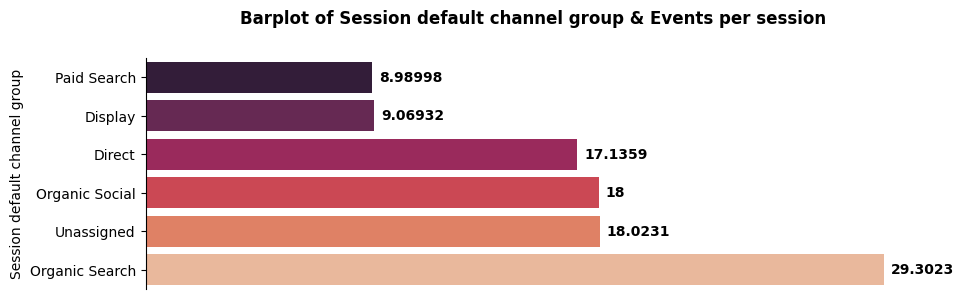

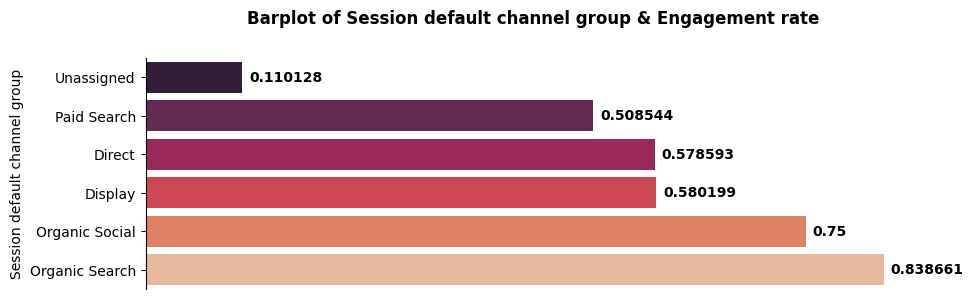

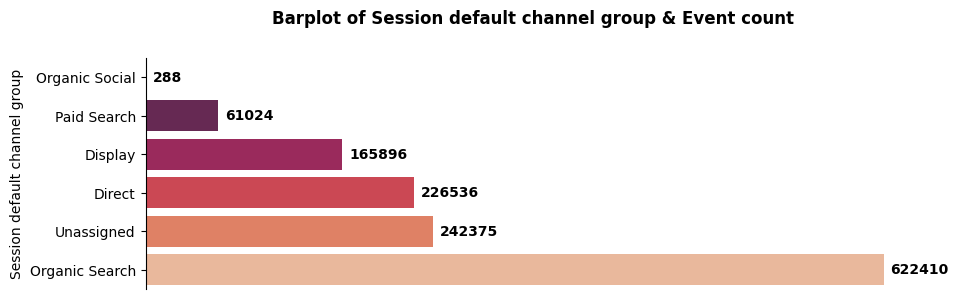

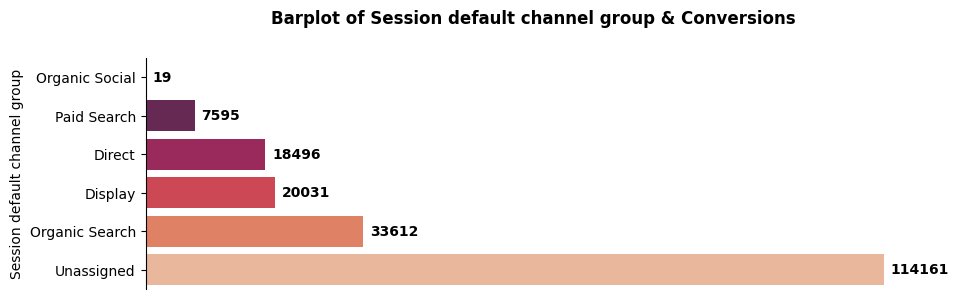

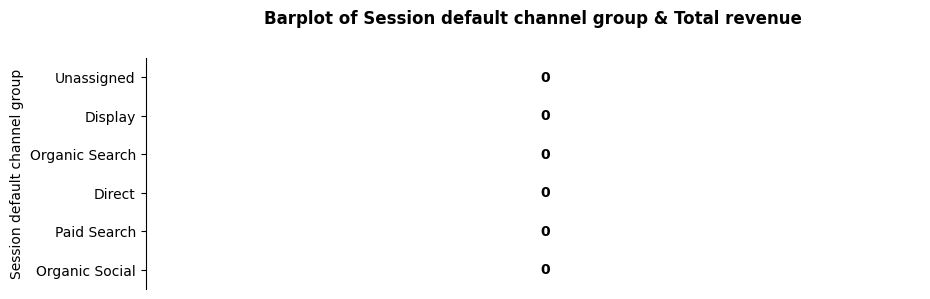

In [33]:
for x in numeric_cols:
  bar_plot(data_traffic_aqs,x,"Session default channel group")

In [34]:
correlation_matrix=data_traffic_aqs[numeric_cols[0:-1]].corr()

In [35]:
correlation_matrix

,Users,Sessions,Engaged sessions,Average engagement time per session,Engaged sessions per user,Events per session,Engagement rate,Event count,Conversions
Users,1.000000,0.516443,0.023209,-0.238669,-0.573267,0.101945,-0.761850,0.332103,0.952170
Sessions,0.516443,1.000000,0.845102,0.422980,0.342450,0.329705,0.006512,0.813759,0.342352
Engaged sessions,0.023209,0.845102,1.000000,0.659011,0.749280,0.481134,0.526670,0.842222,-0.127807
Average engagement time per session,-0.238669,0.422980,0.659011,1.000000,0.850616,0.745376,0.537069,0.719141,-0.162455
Engaged sessions per user,-0.573267,0.342450,0.749280,0.850616,1.000000,0.468970,0.828363,0.545086,-0.591930
Events per session,0.101945,0.329705,0.481134,0.745376,0.468970,1.000000,0.360857,0.789226,0.231273
Engagement rate,-0.761850,0.006512,0.526670,0.537069,0.828363,0.360857,1.000000,0.244410,-0.793489
Event count,0.332103,0.813759,0.842222,0.719141,0.545086,0.789226,0.244410,1.000000,0.306091
Conversions,0.952170,0.342352,-0.127807,-0.162455,-0.591930,0.231273,-0.793489,0.306091,1.000000


<Axes: title={'center': 'Heatmap of correlation score of columns in Traffic acquistion'}>

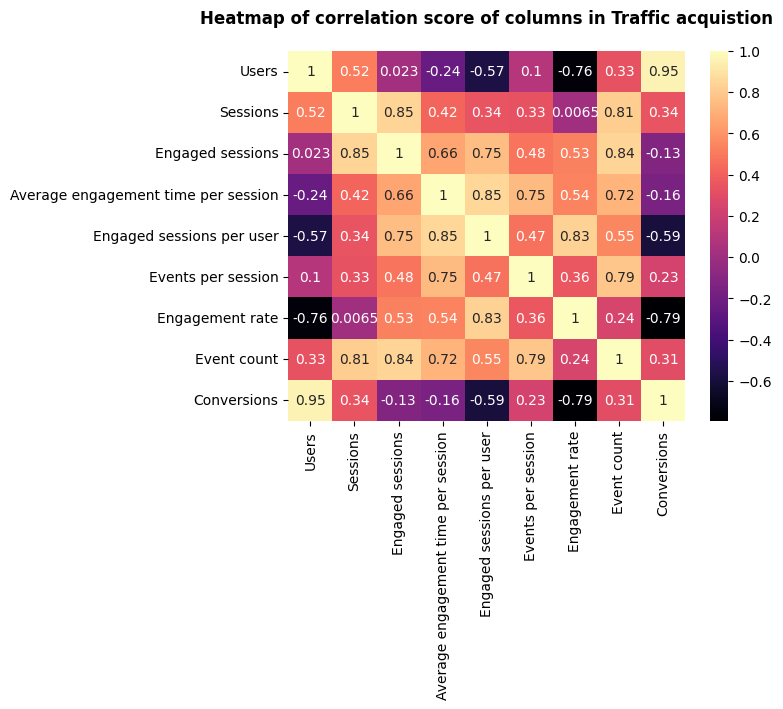

In [36]:
plt.title("Heatmap of correlation score of columns in Traffic acquistion",pad=20,fontweight='bold')
sns.heatmap(data=correlation_matrix,annot=True,cmap='magma')

**Good correlation score is observed between Users & Engagement rate, Sessions & Engaged sessions, Sessions & Event count, Sessions & Event count, Engaged sessions & Engaged sessions per user, Engaged sessions & Event count, Average engagement time per session & Engaged sessions per user, Average engagement time per session & Events per session, Average engagement time per session & Event count, Engaged sessions per user & Engagement rate, Events per session & Average engagement time per session and Events per session & Event count**

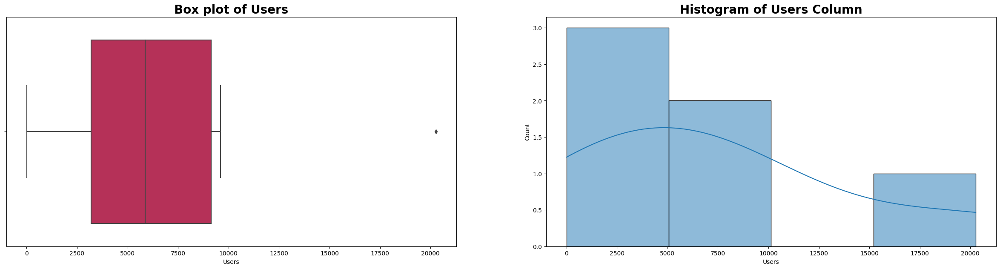

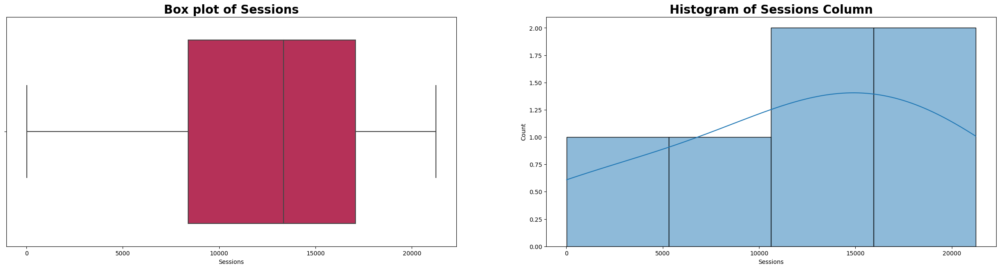

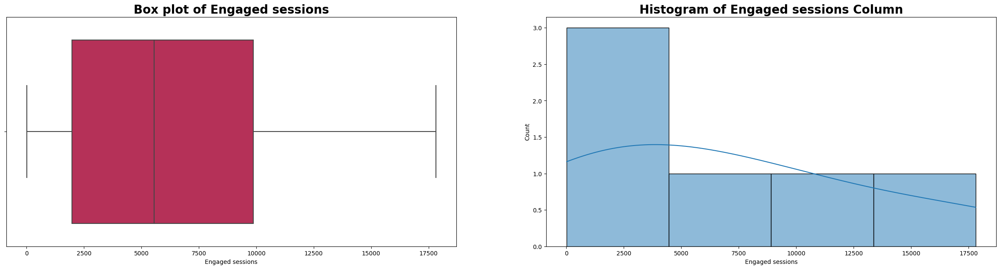

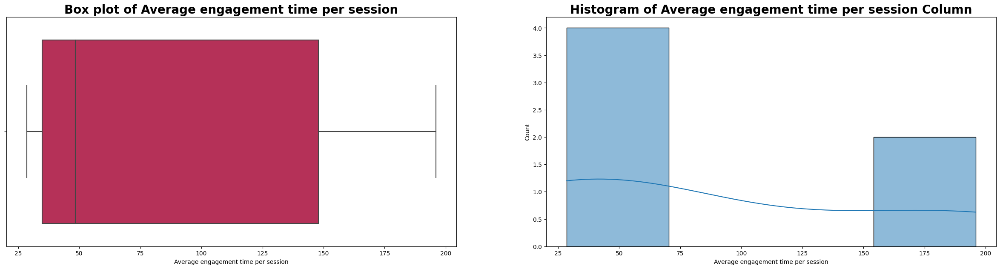

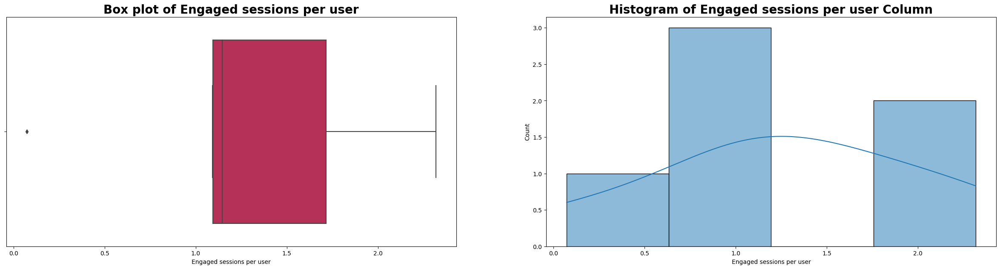

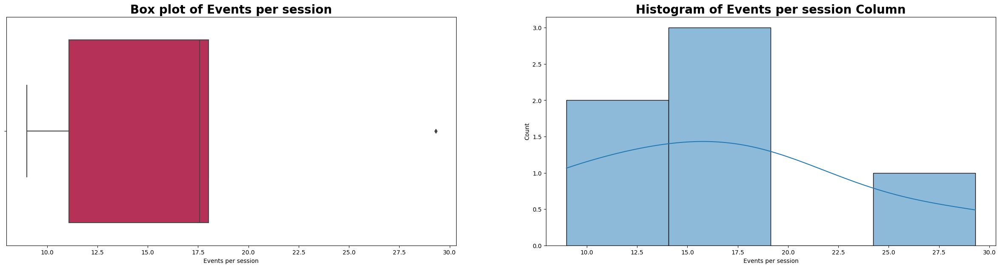

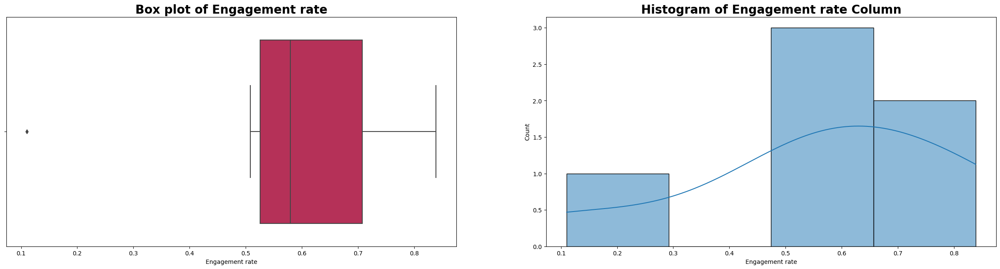

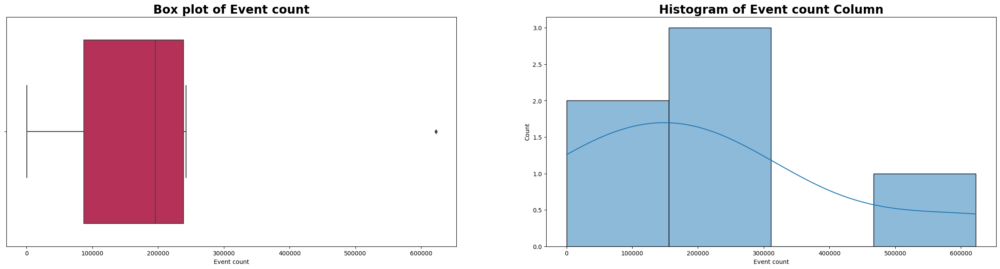

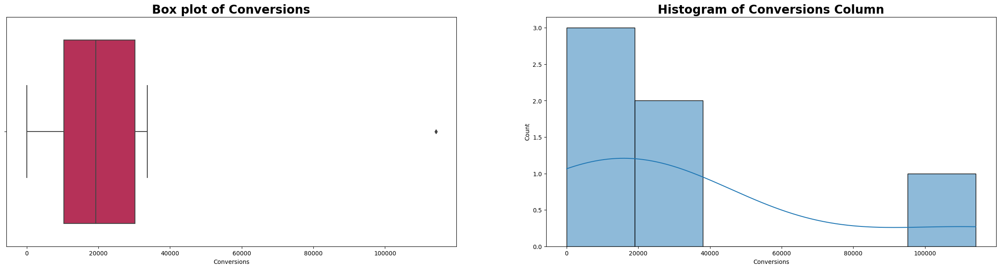

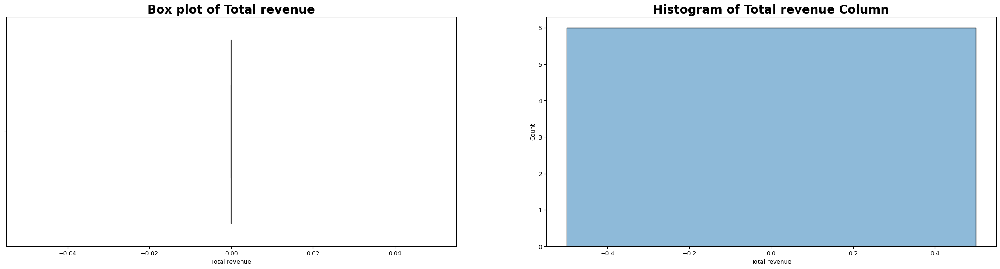

In [37]:
for x in numeric_cols:
  hist_and_box_plots(data_traffic_aqs,x)

**There are outliers in the following columns:** Users, Engaged sessions per user, Events per session, Engagement rate, Event count and Conversions

### 4. Event Report

In [38]:
data_event_report=pd.read_excel("Promilo_BA.xlsx",sheet_name='Event Report')
data_event_report.head()


,Event name,Event count,Total users,Event count per user,Total revenue
0,screen_view,694729,23254,30.865870,0
1,notification_receive,125146,1700,138.896800,0
2,user_engagement,124836,22699,5.622230,0
3,notification_dismiss,70128,1369,144.000000,0
4,session_start,61163,23226,3.121357,0


In [39]:
data_event_report.sample(7).style.bar(cmap='inferno',height=50,width=90)

,Event name,Event count,Total users,Event count per user,Total revenue
242,Promilo111_Event_Log_With_Facebook,23,11,2.090909,0
240,Promilo1116_Event_error_code_800,24,3,8.000000,0
299,Promilo1113_my_profile_others,4,1,4.000000,0
328,Promilo11157724_Submit_OTP_Mobile,2,1,2.000000,0
21,Promilo1116_Event_Enter_Feed_Page,3444,1799,1.914397,0
32,notification_foreground,2096,286,7.485714,0
111,Promilo106_campaign_interest,360,74,4.864865,0


In [40]:
data_event_report.shape

(379, 5)

In [41]:
data_event_report.describe().T

,count,mean,std,min,25%,50%,75%,max
Event count,379.0,3478.968338,37073.635167,0.0,7.000000,63.00,503.500000,694729.0
Total users,379.0,583.583113,2791.449046,1.0,3.500000,31.00,238.000000,23254.0
Event count per user,379.0,3.220647,10.403279,0.0,1.252451,1.75,2.793359,144.0
Total revenue,379.0,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.0


In [42]:
data_event_report.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 379 entries, 0 to 378
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Event name            378 non-null    object 
 1   Event count           379 non-null    int64  
 2   Total users           379 non-null    int64  
 3   Event count per user  379 non-null    float64
 4   Total revenue         379 non-null    int64  
dtypes: float64(1), int64(3), object(1)
memory usage: 14.9+ KB


In [43]:
null_rows=data_event_report[data_event_report.isnull().any(axis=1)]
null_rows

,Event name,Event count,Total users,Event count per user,Total revenue
179,NaN,80,5,16.0,0


In [44]:
data_event_report.dropna(inplace=True)

In [45]:
data_event_report.isnull().sum()

Event name              0
Event count             0
Total users             0
Event count per user    0
Total revenue           0
dtype: int64

In [46]:
data_event_report.duplicated().sum()

0

In [47]:
data_event_report['Event name'].value_counts()

screen_view                            1
Promilo119_my_interests_screen         1
Promilo1113_myProfile_mediator         1
Promilo113_Event_error_code_800        1
Promilo1115_Event_error_code_120004    1
                                      ..
Promilo1114_dashboard                  1
Promilo111_calculator_intro            1
Promilo1114_Event_Log_With_Google      1
Promilo1116_my_profile_learners        1
(not set)                              1
Name: Event name, Length: 378, dtype: int64

In [48]:
numeric_cols,cat_cols=columns(data_event_report)
combis=list(combinations(numeric_cols,2))
combis

[('Event count', 'Total users'),
 ('Event count', 'Event count per user'),
 ('Event count', 'Total revenue'),
 ('Total users', 'Event count per user'),
 ('Total users', 'Total revenue'),
 ('Event count per user', 'Total revenue')]

In [49]:
cat_cols

Index(['Event name'], dtype='object')

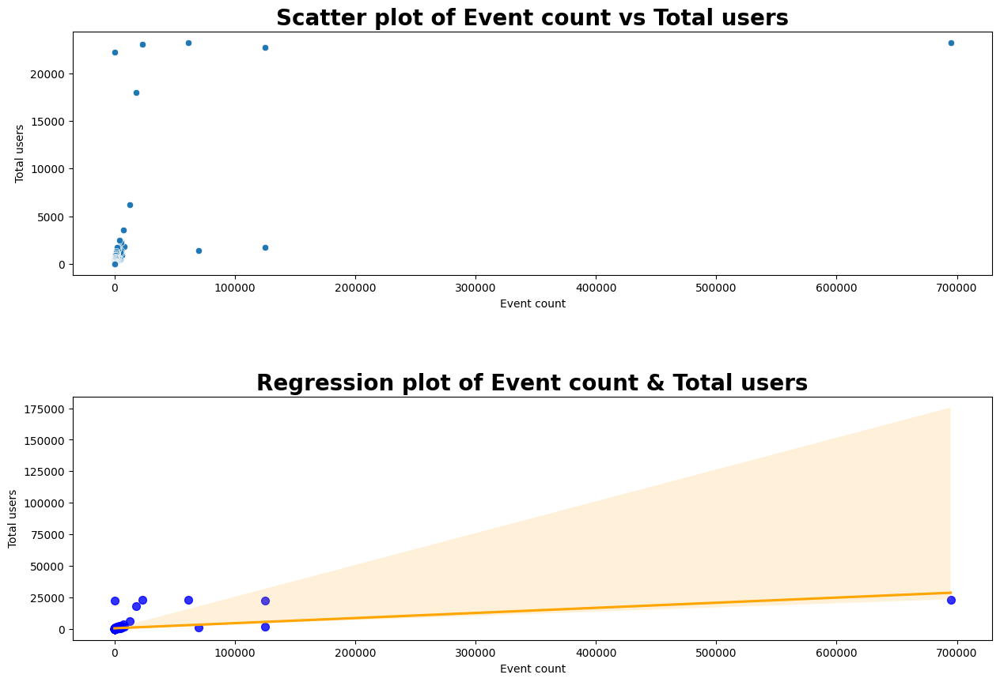

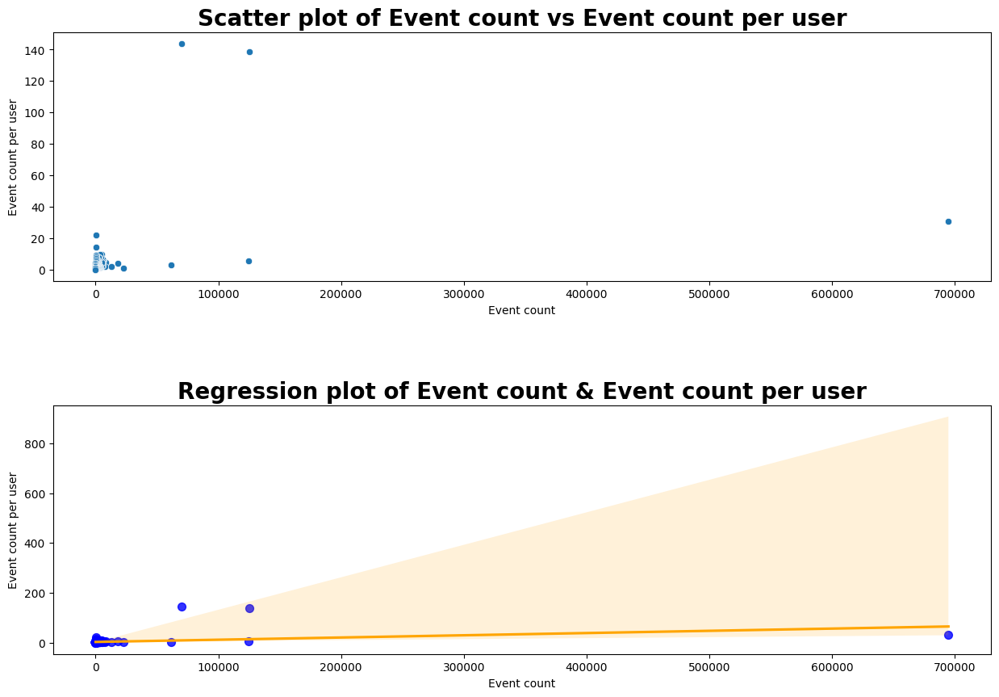

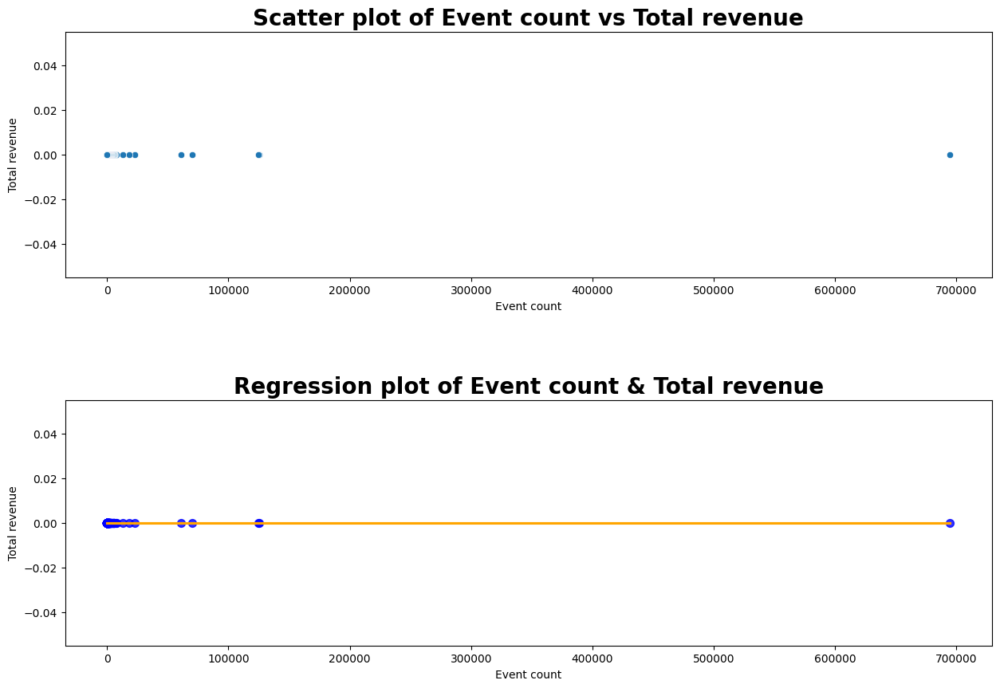

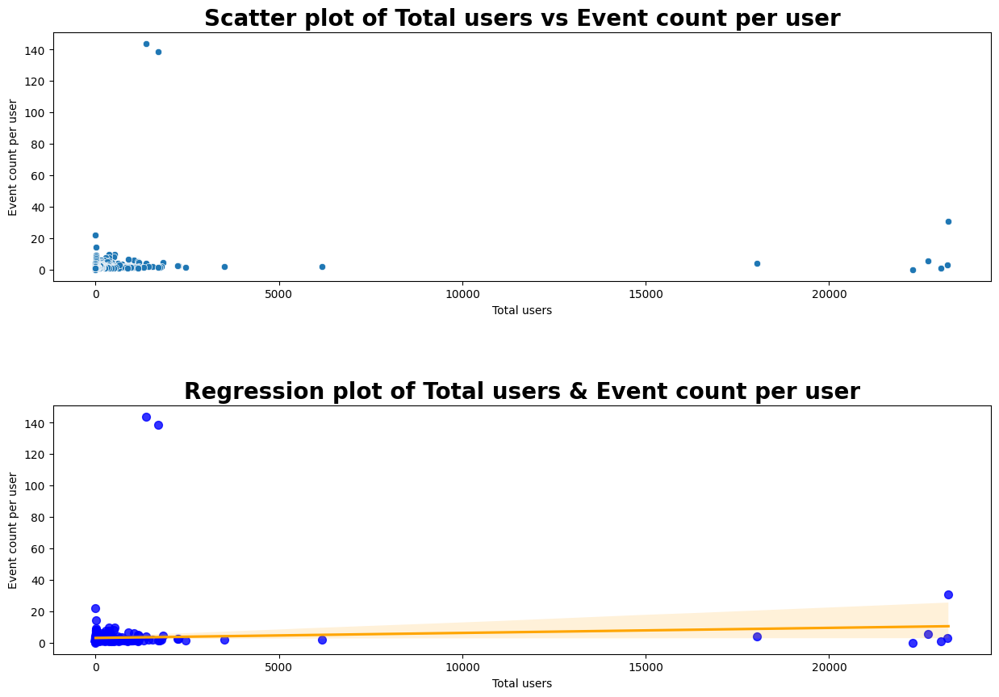

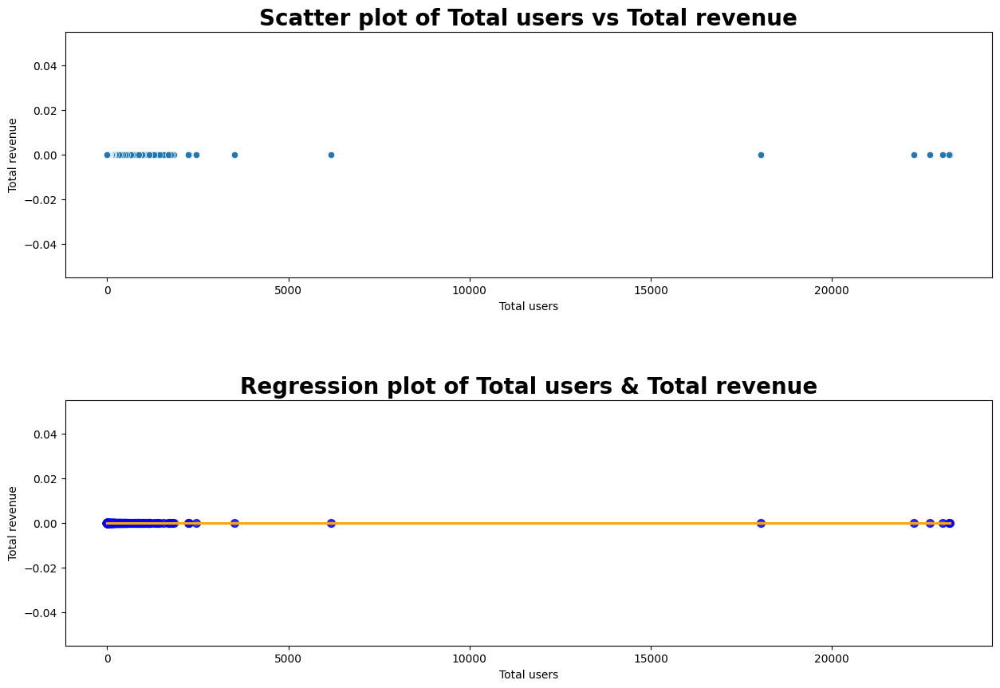

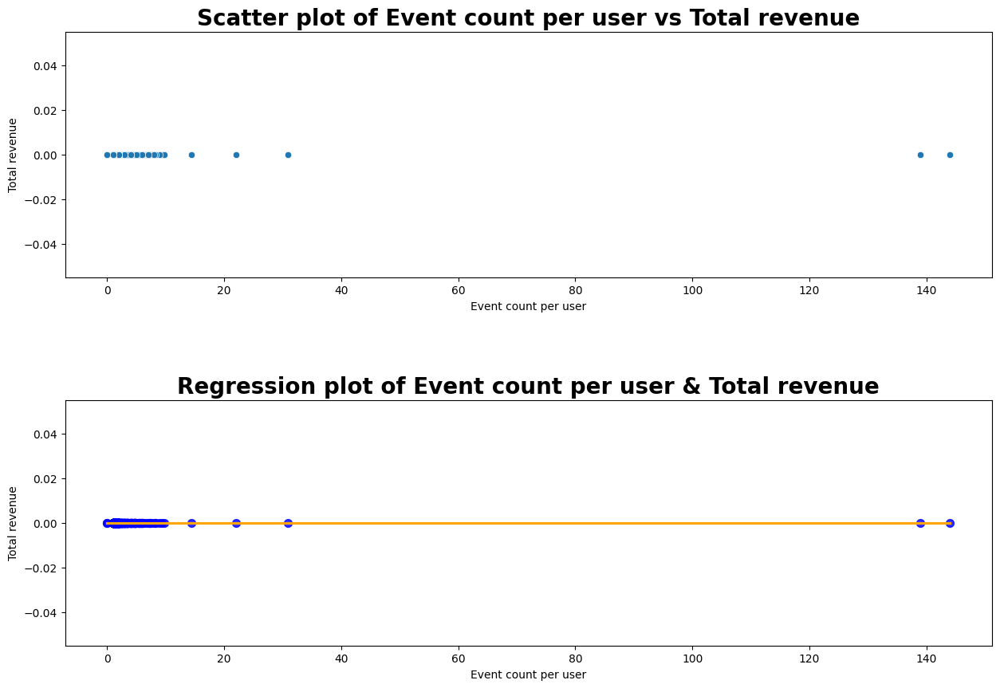

In [50]:
for x in combis:
  # fig=sns.regplot(data=data_event_report,x=x[0],y=x[1],color='orange',scatter_kws={"facecolors": "blue",'s':50,'edgecolor':'blue'}).set_title(f"Regression plot of {x[0]} & {x[1]}",fontweight='bold',fontsize=20)
  # plt.show()
  scatter_and_reg_plots(data_event_report,x[0],x[1])


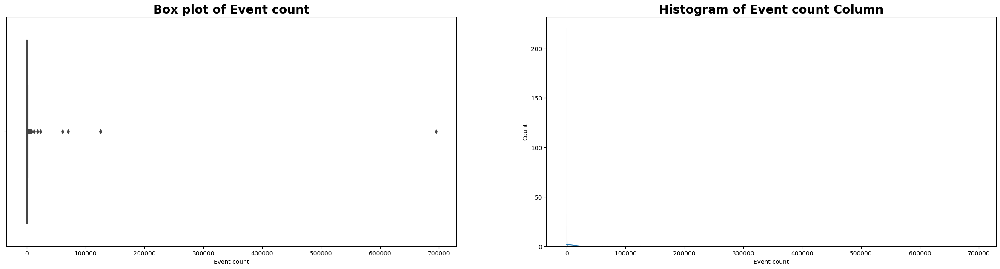

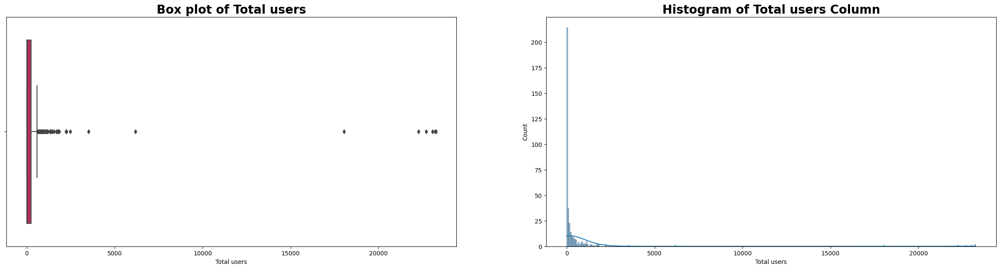

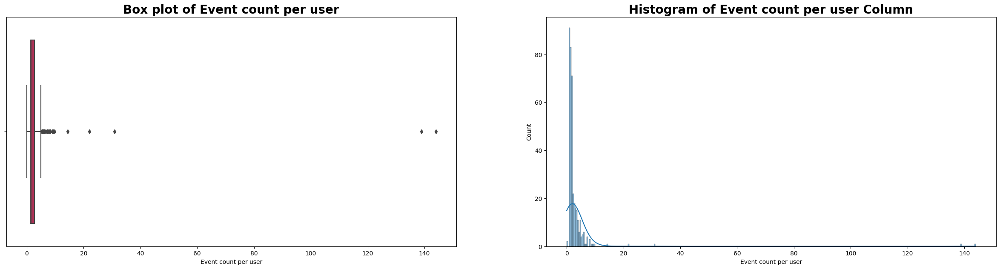

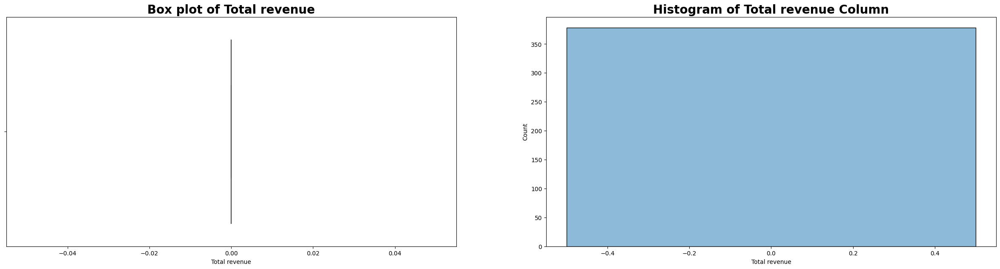

In [51]:
for x in numeric_cols:
  hist_and_box_plots(data_event_report,x)

**Except in total revenue column there are outliers in all other columns**

In [52]:
correlation_matrix=data_event_report[numeric_cols[:-1]].corr()
correlation_matrix

,Event count,Total users,Event count per user
Event count,1.000000,0.538614,0.318821
Total users,0.538614,1.000000,0.086372
Event count per user,0.318821,0.086372,1.000000


<Axes: title={'center': 'Heatmap of correlation score of columns in Event Report'}>

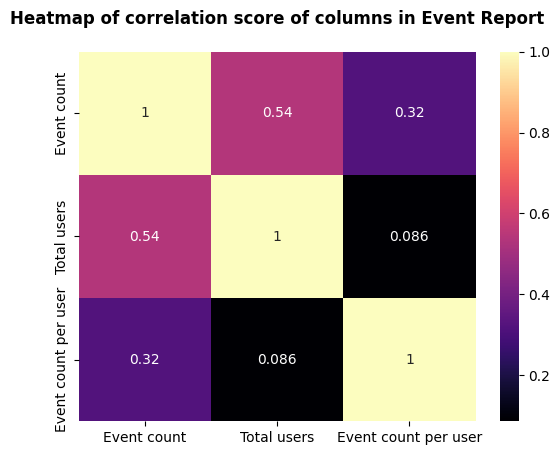

In [53]:
plt.title("Heatmap of correlation score of columns in Event Report",pad=20,fontweight='bold')
sns.heatmap(data=correlation_matrix,annot=True,cmap='magma')

**Good correlatino score is observed between Total users & Event count per user**

### 5. Conversion Report

In [54]:
data_conversion_report=pd.read_excel("Promilo_BA.xlsx",sheet_name='Conversion Report')
data_conversion_report.head()

,Event name,Conversions,Total users,Total revenue
0,notification_receive,94890,1311,0
1,session_start,56203,21674,0
2,first_open,22872,23059,0
3,app_remove,12468,12538,0
4,Promilo111_otp_screen,1738,855,0


In [55]:
data_conversion_report.sample(7).style.bar(cmap='rainbow',height=50,width=90)

,Event name,Conversions,Total users,Total revenue
14,Promilo106_my_interests_screen,117,23,0
2,first_open,22872,23059,0
11,Promilo106_my_meetings_screen,136,20,0
8,os_update,672,634,0
13,Promilo106_resume_builder,127,66,0
1,session_start,56203,21674,0
7,Promilo106_feeds,683,185,0


In [56]:
numeric_cols,cat_cols=columns(data_conversion_report)
combis=list(combinations(numeric_cols,2))
combis

[('Conversions', 'Total users'),
 ('Conversions', 'Total revenue'),
 ('Total users', 'Total revenue')]

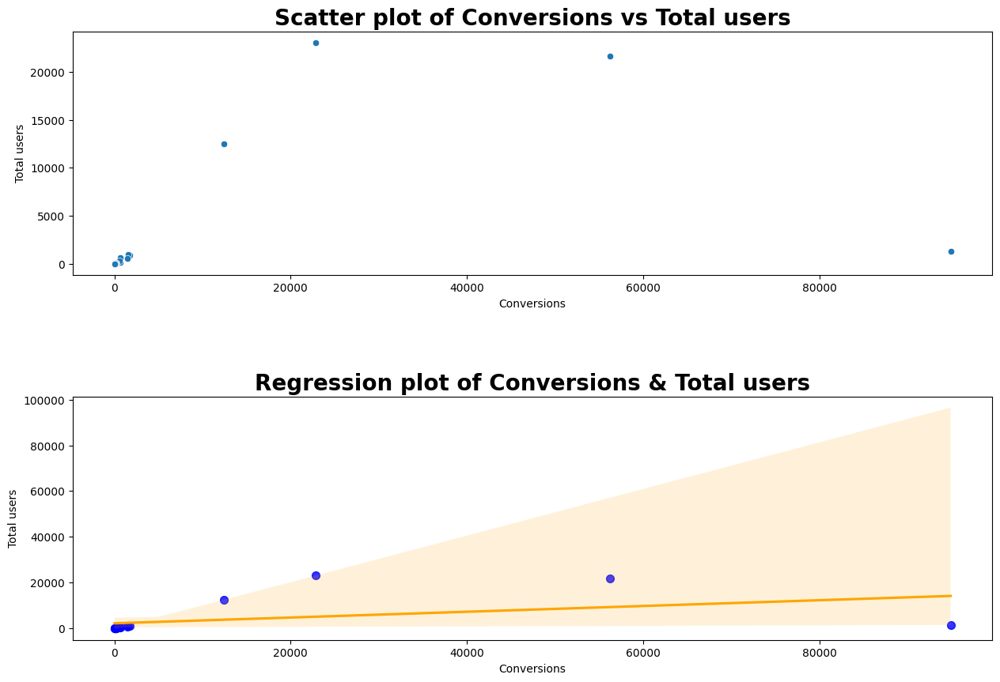

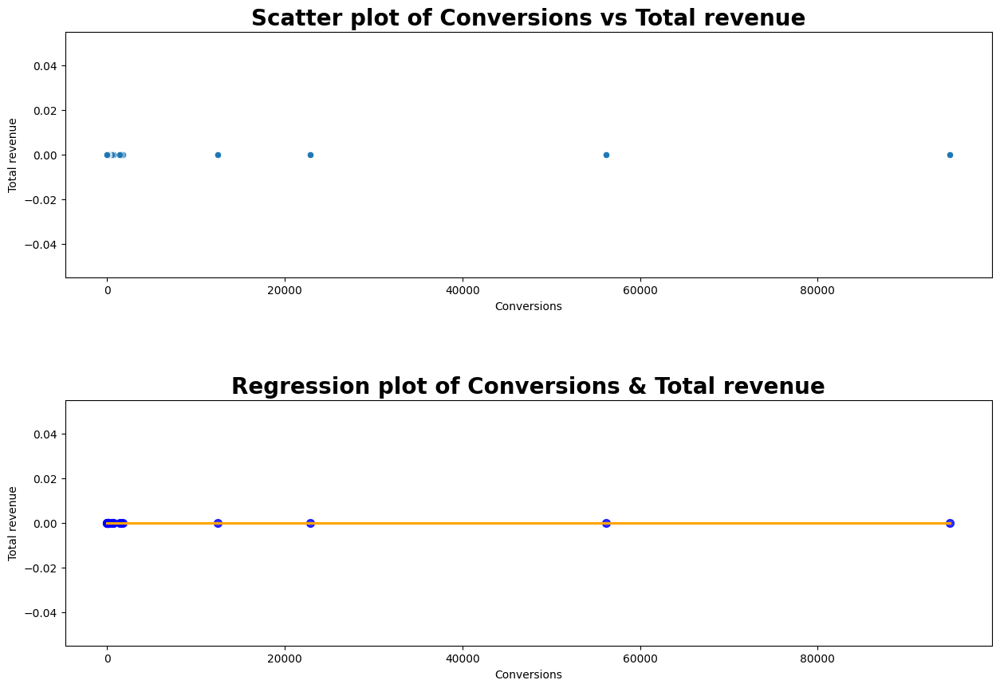

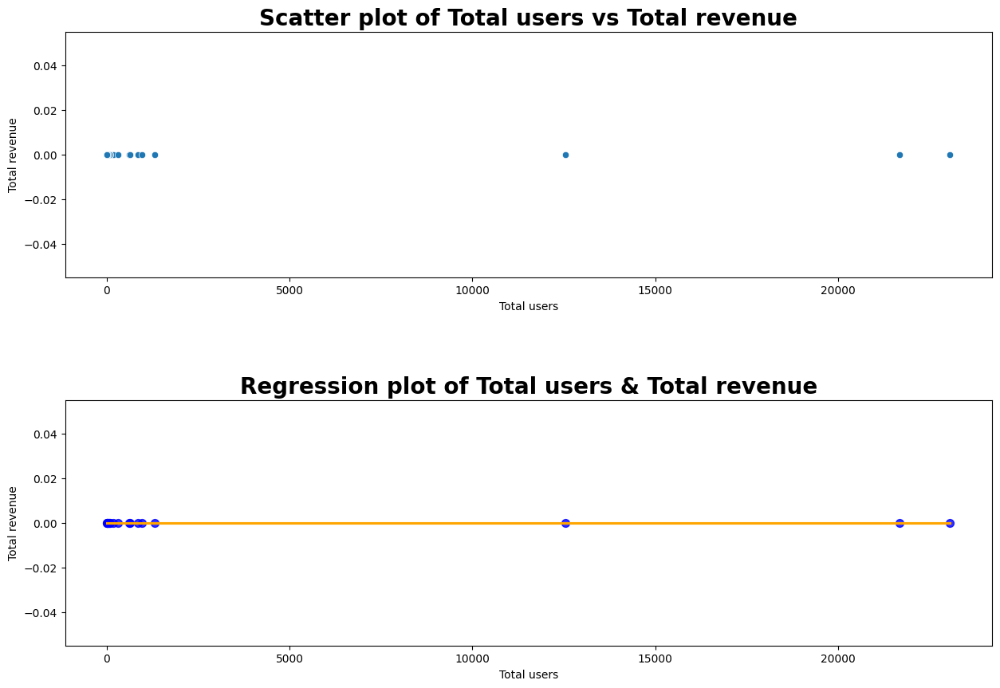

In [57]:
for x in combis:
  scatter_and_reg_plots(data_conversion_report,x[0],x[1])

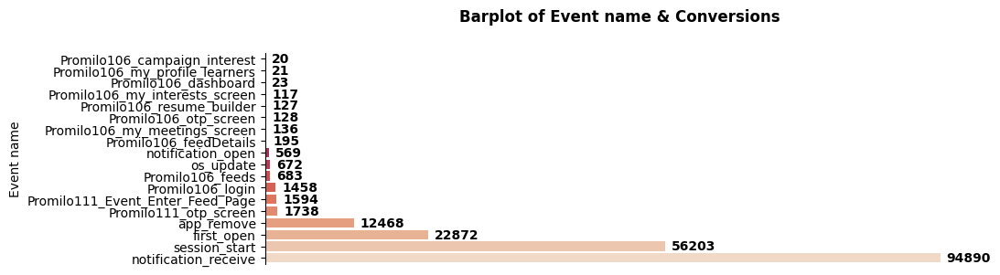

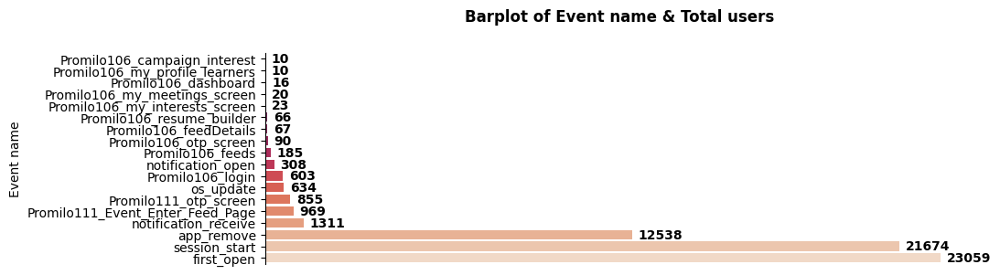

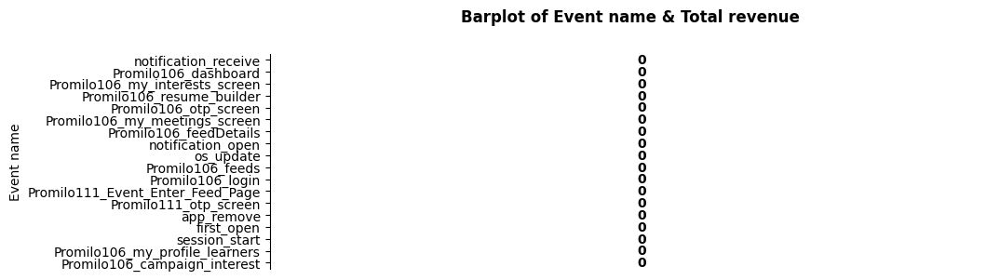

In [58]:
for x in numeric_cols:
  bar_plot(data_conversion_report,x,cat_cols[0])

In [59]:
correlation_matrix=data_conversion_report[numeric_cols[0:-1]].corr()

<Axes: title={'center': 'Heatmap of correlation score of columns in Conversion Report'}>

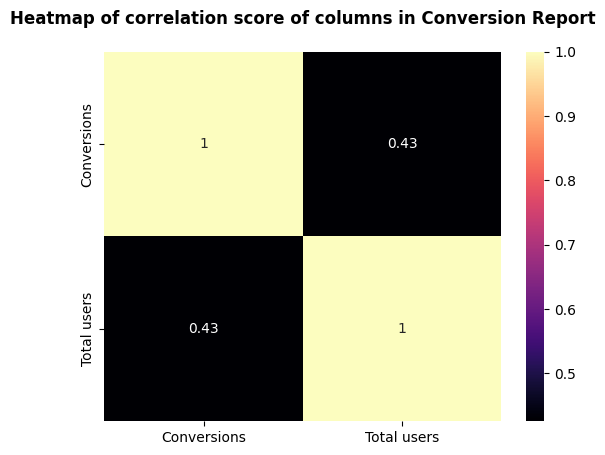

In [60]:
plt.title("Heatmap of correlation score of columns in Conversion Report",pad=20,fontweight='bold')
sns.heatmap(data=correlation_matrix,annot=True,cmap='magma')

**There are no good correlated columns**

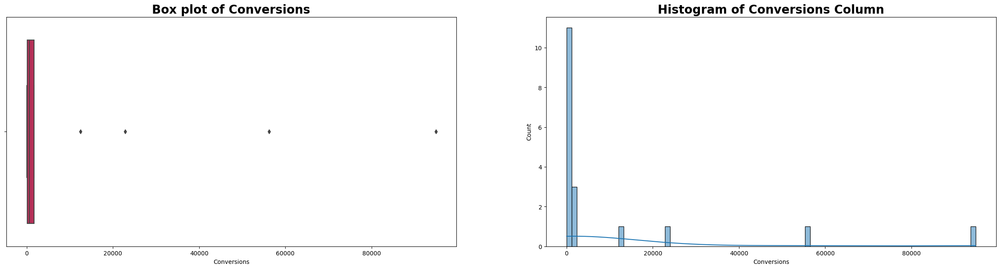

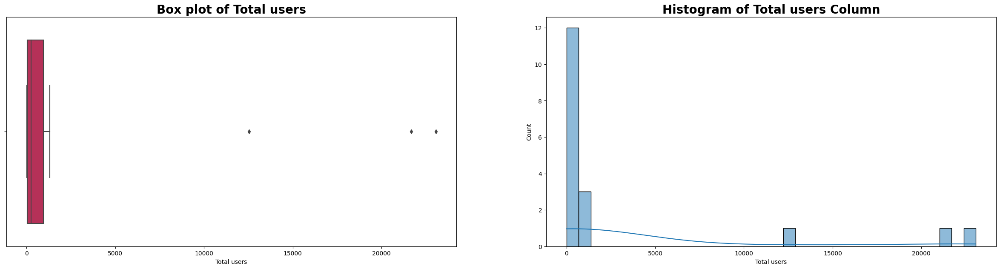

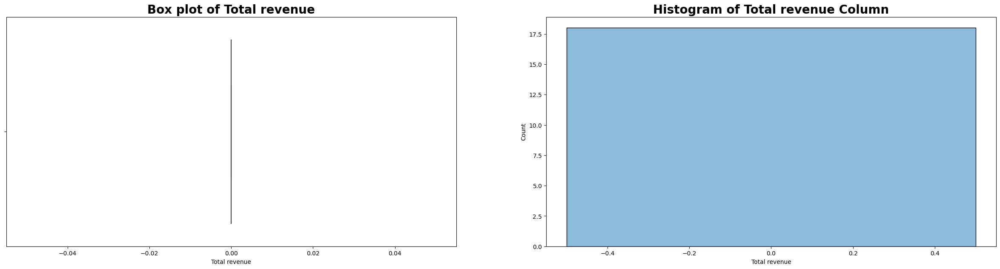

In [61]:
for x in numeric_cols:
  hist_and_box_plots(data_conversion_report,x)

**There are outliers in all the columns.**

### 6. pages and Screen report



In [62]:
data_pagesNscreen_report=pd.read_excel("Promilo_BA.xlsx",sheet_name='Pages & Screens Report')
data_pagesNscreen_report.head()

,Page path and screen class,Views,Users,Views per user,Average engagement time,Event count,Conversions,Total revenue
0,Flutter,156708,8726,17.958740,83.41222,203901,328,0
1,MainActivity,44326,8978,4.937180,78.29216,53374,101,0
2,feeds,18514,4358,4.248279,61.60005,37628,253,0
3,login,16883,7291,2.315595,34.88177,40772,435,0
4,my_rewards_screen,15381,2045,7.521271,94.17995,32910,5,0


In [63]:
data_pagesNscreen_report['Page path and screen class'].duplicated().sum()

0

In [64]:
numeric_cols,cat_cols=columns(data_pagesNscreen_report)
numeric_cols

Index(['Views', 'Users', 'Views per user', 'Average engagement time',
       'Event count', 'Conversions', 'Total revenue'],
      dtype='object')

In [65]:
combis=list(combinations(numeric_cols,2))
combis

[('Views', 'Users'),
 ('Views', 'Views per user'),
 ('Views', 'Average engagement time'),
 ('Views', 'Event count'),
 ('Views', 'Conversions'),
 ('Views', 'Total revenue'),
 ('Users', 'Views per user'),
 ('Users', 'Average engagement time'),
 ('Users', 'Event count'),
 ('Users', 'Conversions'),
 ('Users', 'Total revenue'),
 ('Views per user', 'Average engagement time'),
 ('Views per user', 'Event count'),
 ('Views per user', 'Conversions'),
 ('Views per user', 'Total revenue'),
 ('Average engagement time', 'Event count'),
 ('Average engagement time', 'Conversions'),
 ('Average engagement time', 'Total revenue'),
 ('Event count', 'Conversions'),
 ('Event count', 'Total revenue'),
 ('Conversions', 'Total revenue')]

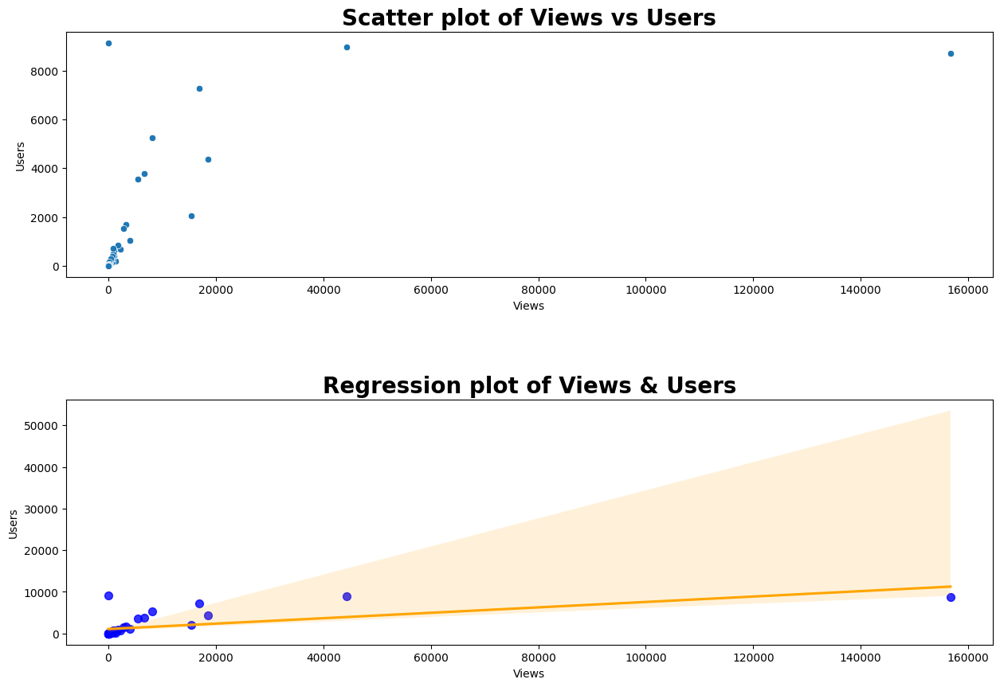

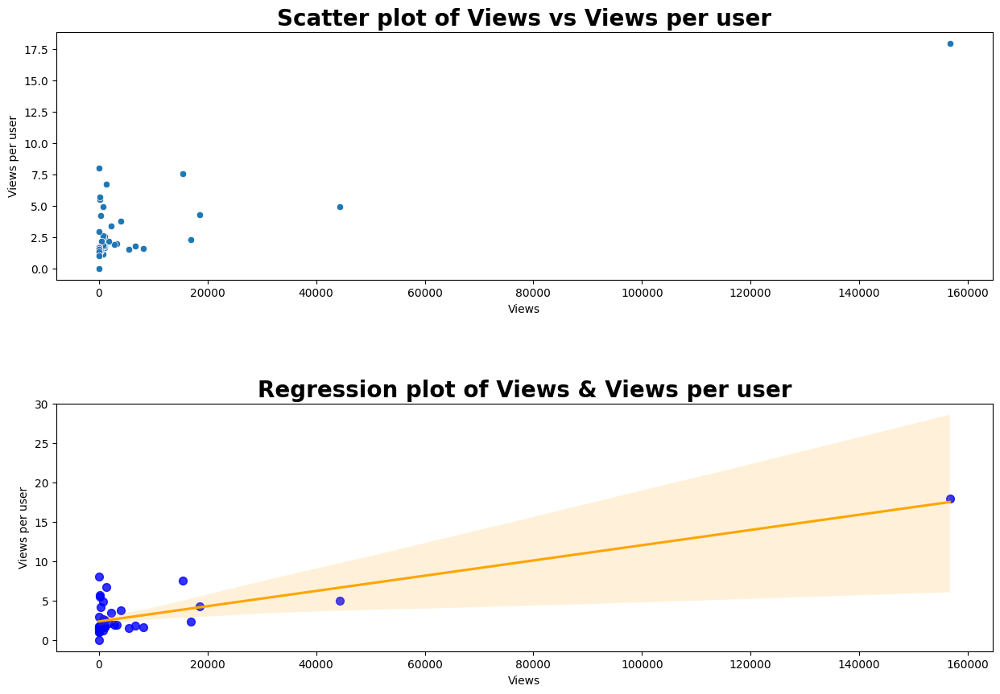

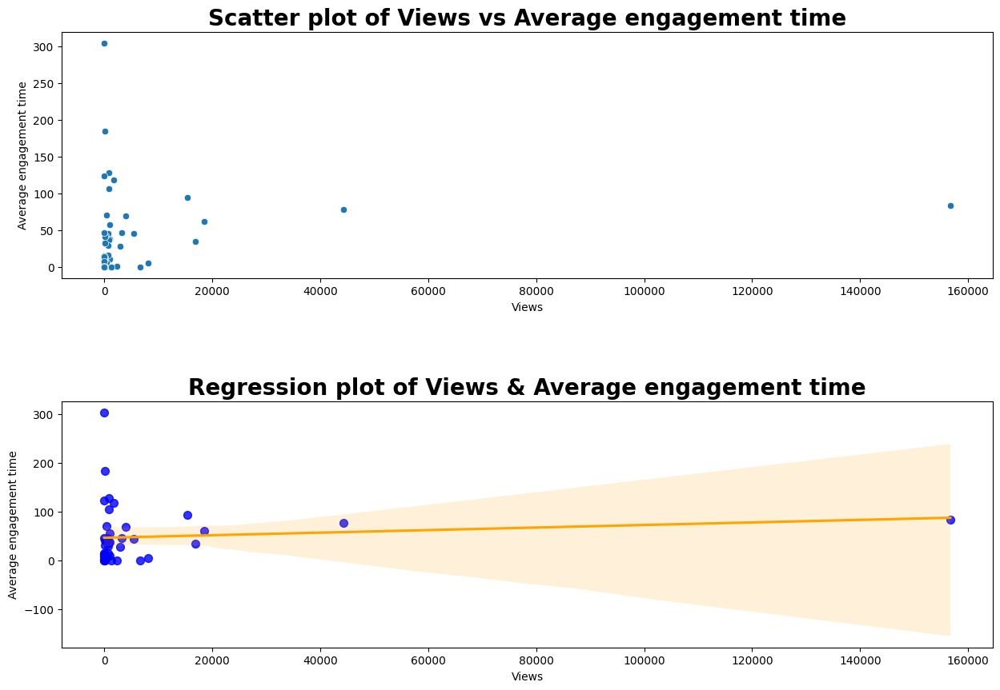

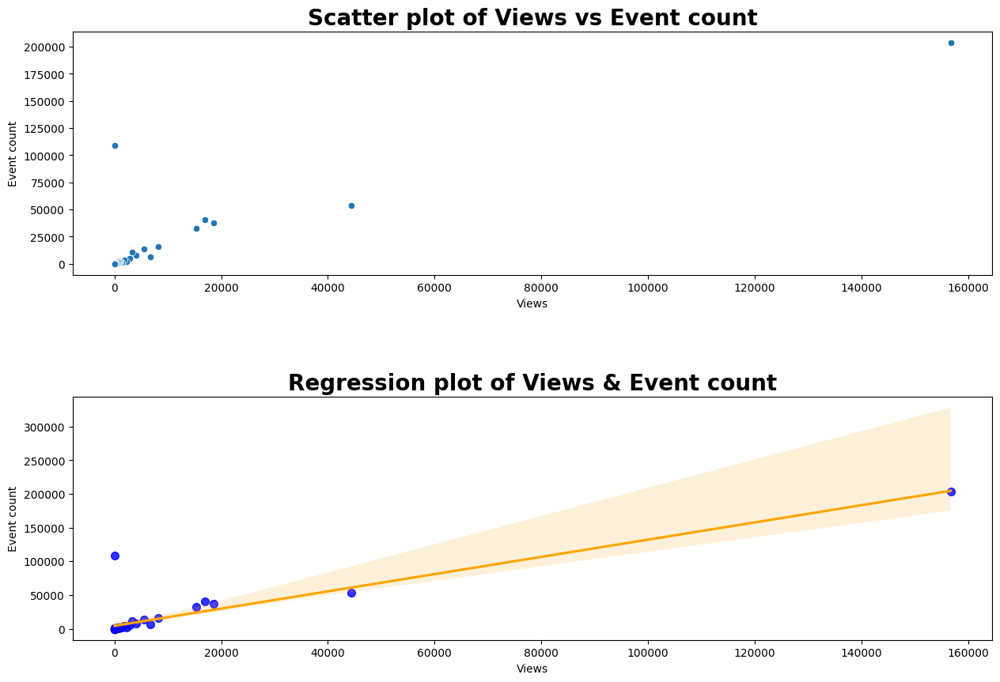

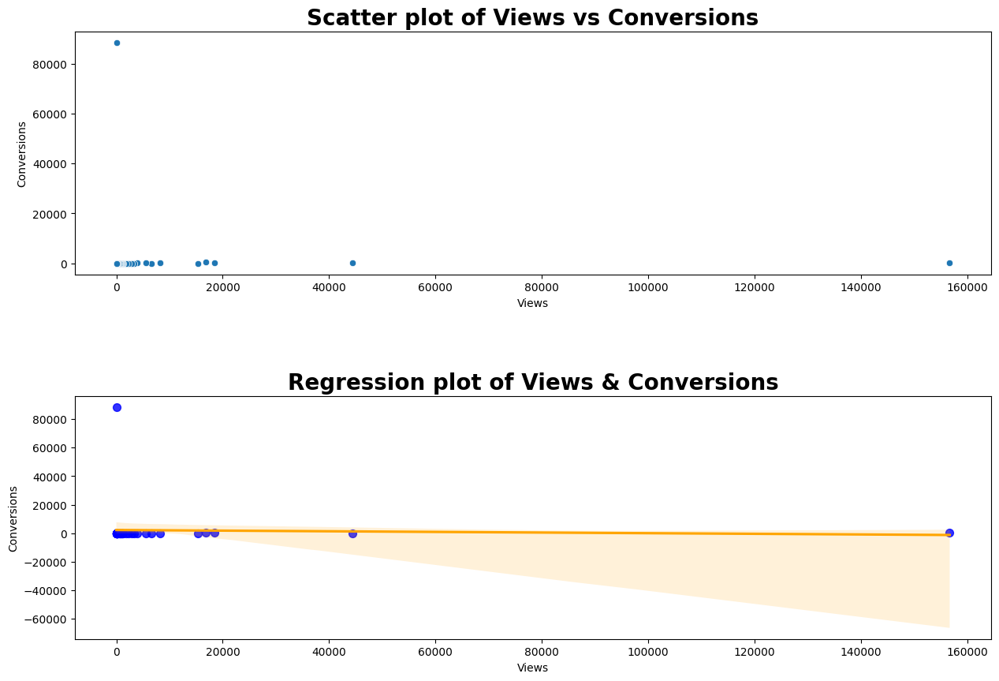

...

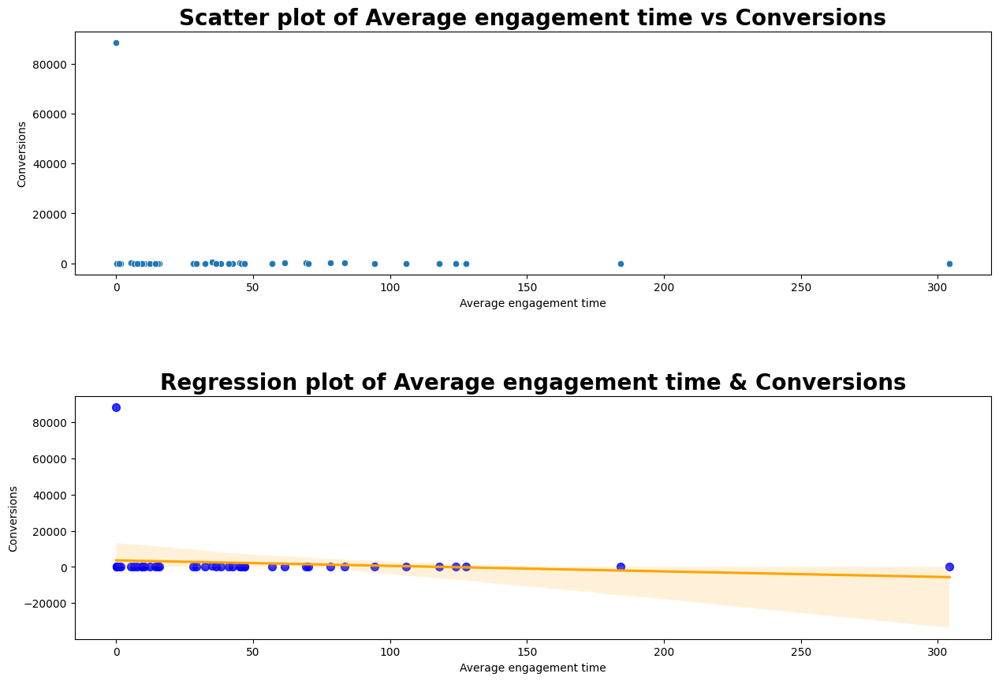

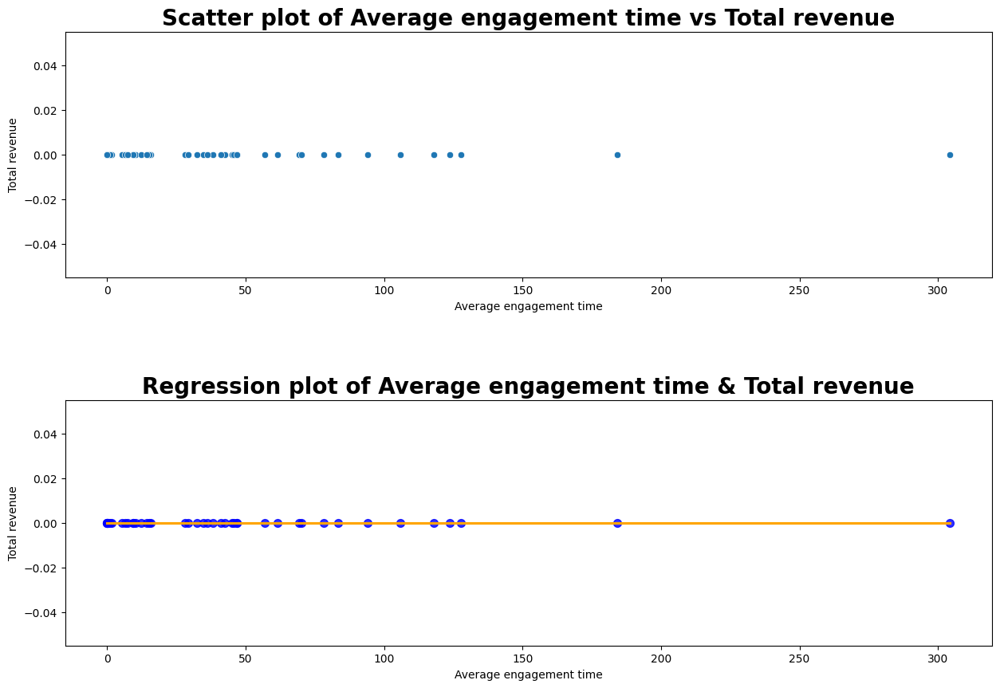

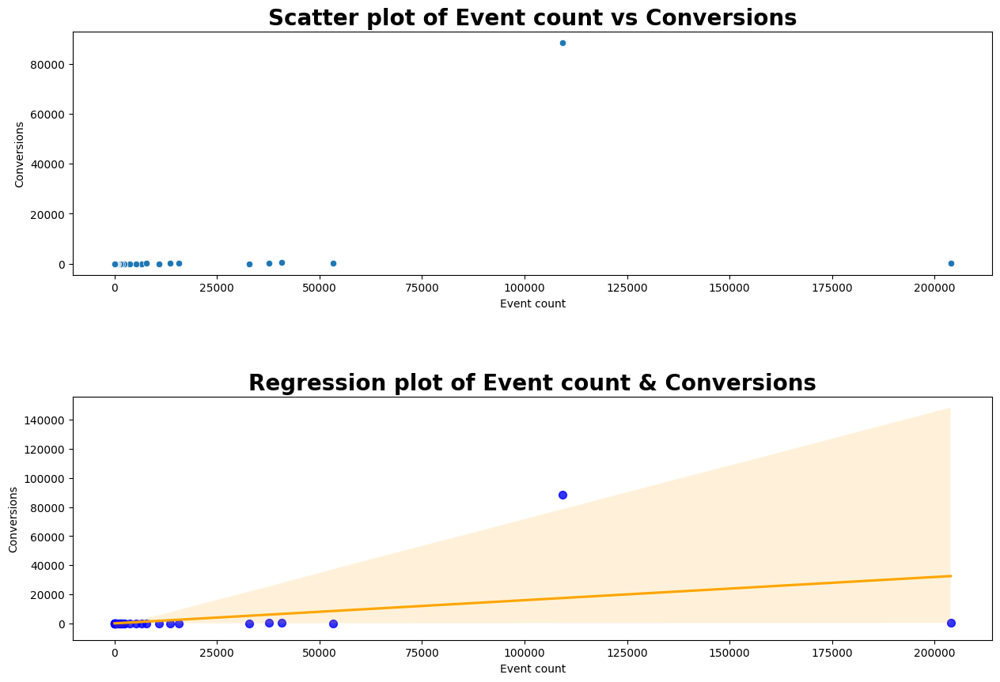

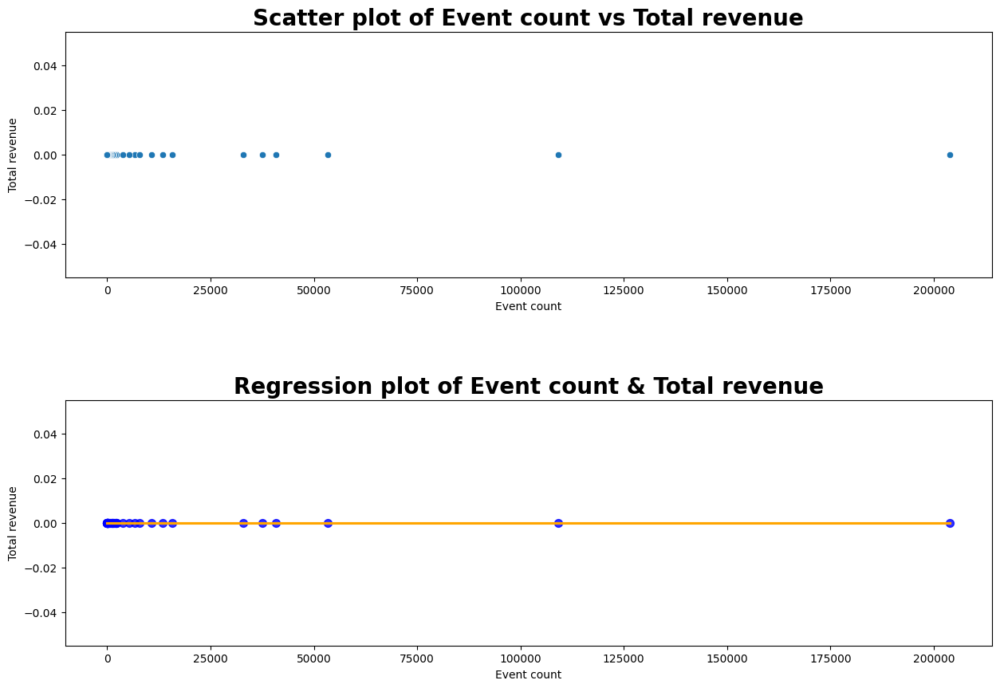

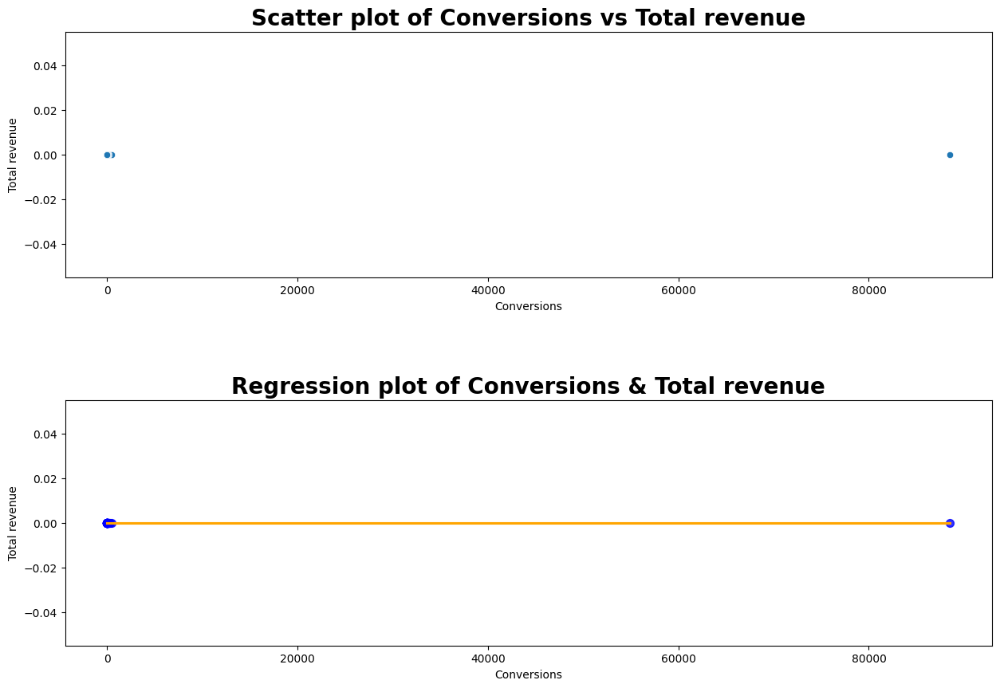

In [66]:
for x in combis:
  scatter_and_reg_plots(data_pagesNscreen_report,x[0],x[1])

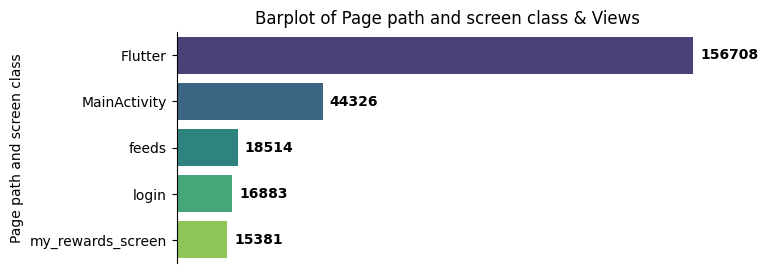

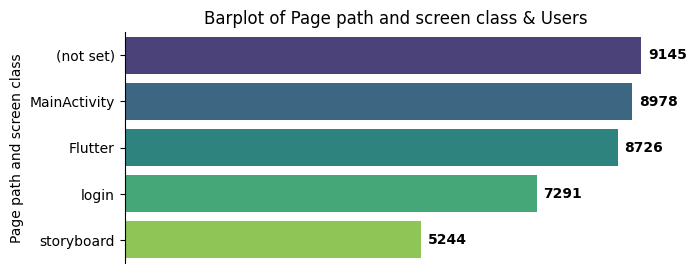

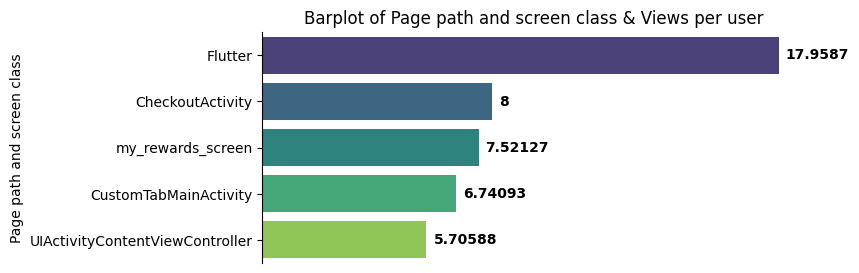

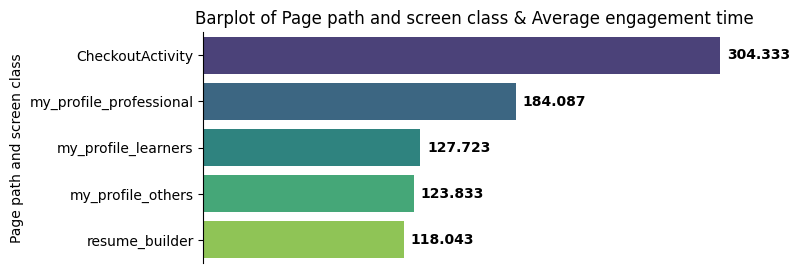

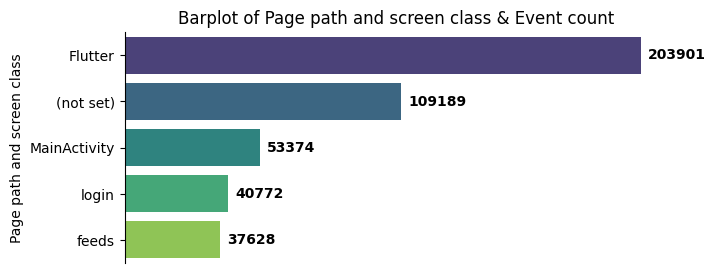

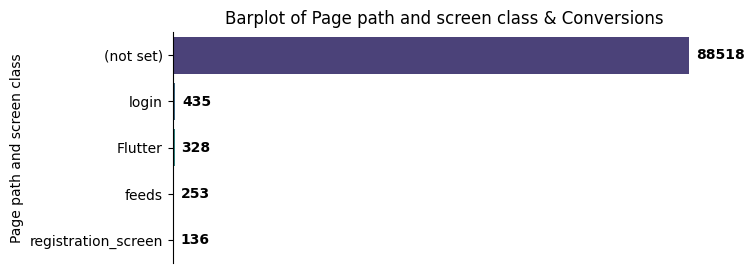

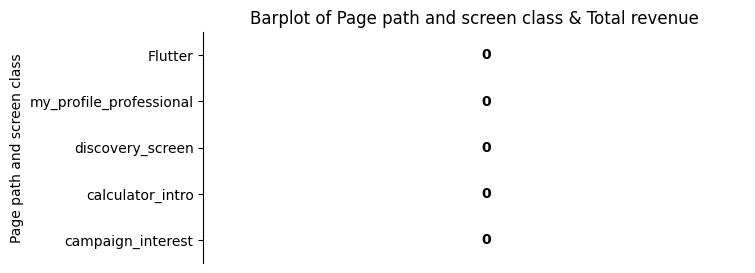

In [67]:
for x in numeric_cols:

  dat=data_pagesNscreen_report.sort_values(by=x,ascending=False).head()
  y=dat.select_dtypes(include='object').columns

  plt.figure(figsize=(7,3))
  plt.title(f'Barplot of {cat_cols[0]} & {x}')
  fig=sns.barplot(data=dat,x=x,y=y[0],palette='viridis')
  fig.bar_label(fig.containers[0],fontweight='bold',padding=5)       # Setting bar labels
  fig.spines[['right','top','bottom']].set_visible(False)            # Removing the chart junk
  fig.xaxis.set_visible(False)                                       # Hiding the x-axis
  plt.show()

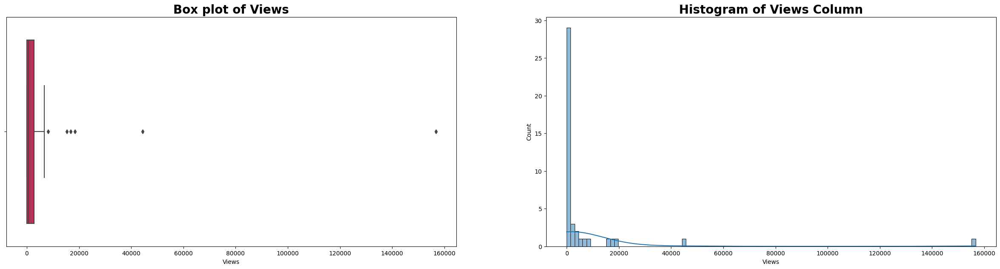

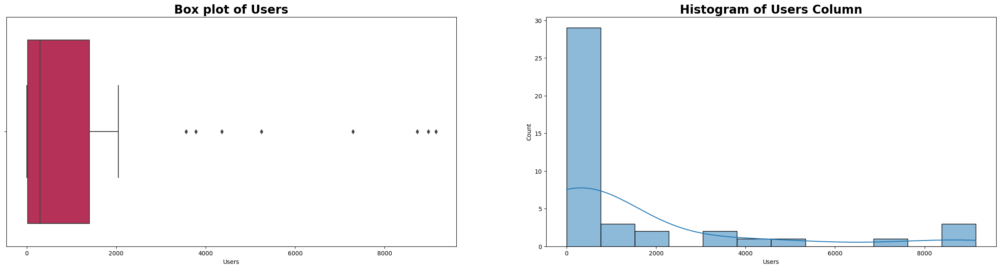

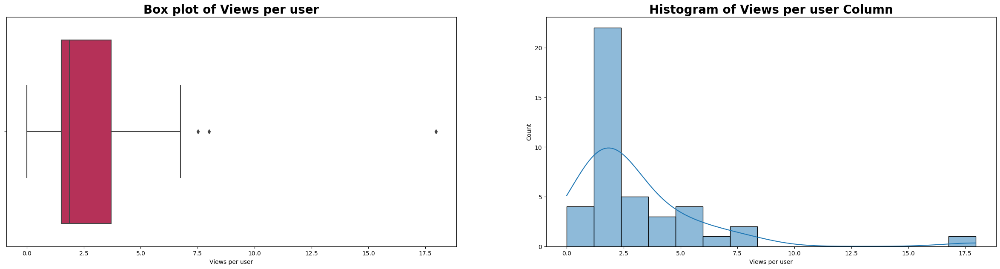

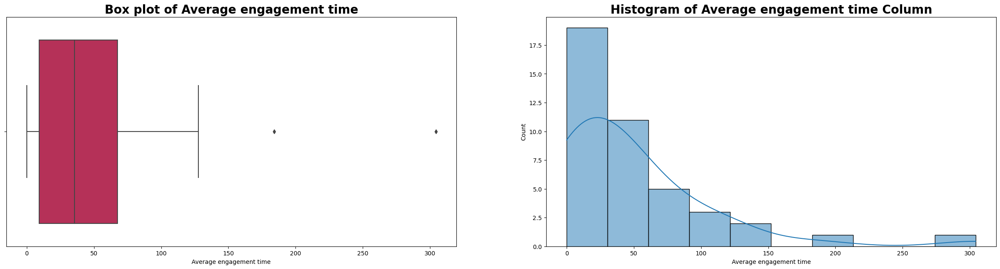

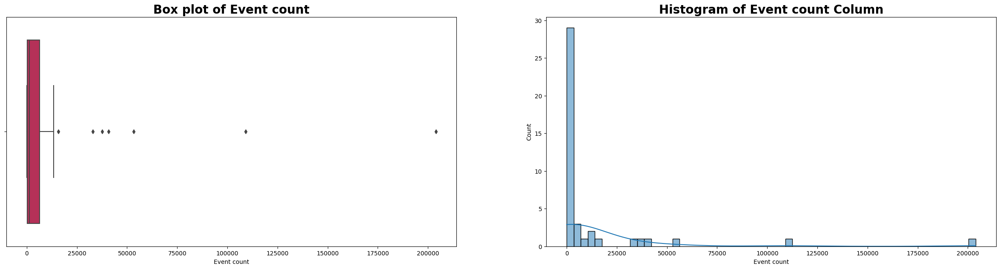

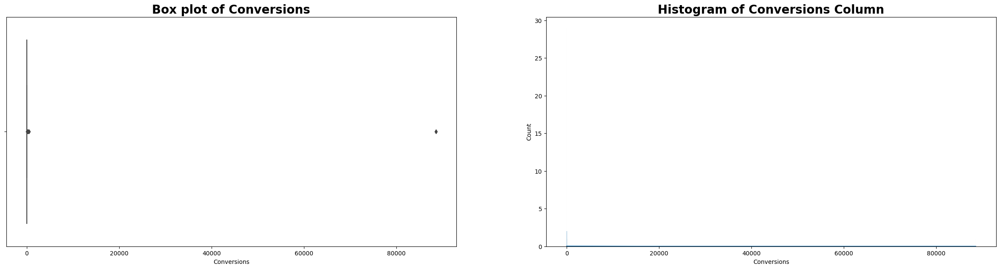

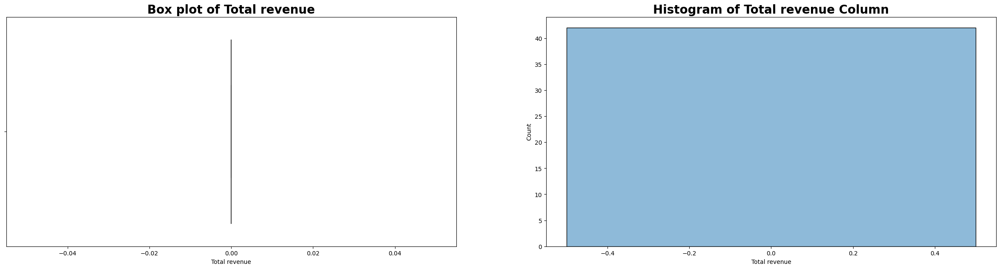

In [68]:
for x in numeric_cols:
  hist_and_box_plots(data_pagesNscreen_report,x)

**There are outliers in all the columns except in Total revenue.**

In [69]:
correlation_matrix=data_pagesNscreen_report[numeric_cols[:-1]].corr()

<Axes: title={'center': 'Heatmap of correlation score of columns in Pages & Screens Report'}>

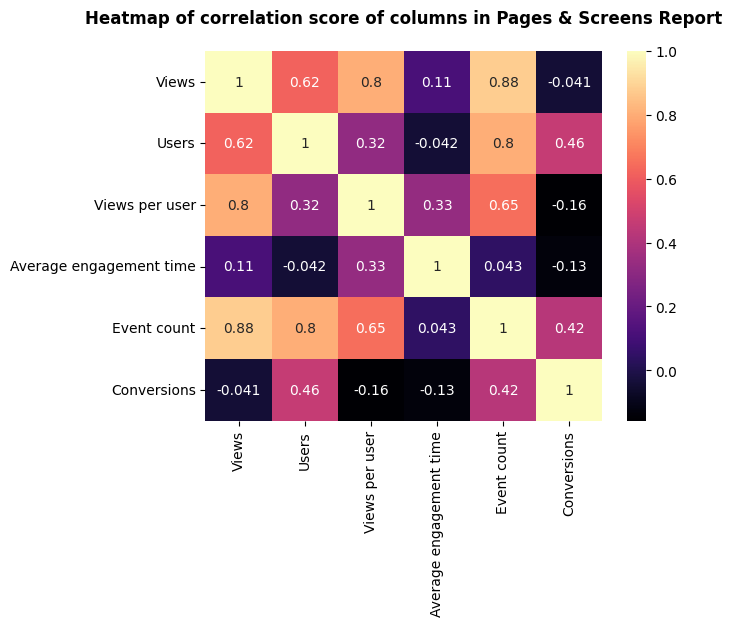

In [70]:
plt.title("Heatmap of correlation score of columns in Pages & Screens Report",pad=20,fontweight='bold')
sns.heatmap(data=correlation_matrix,annot=True,cmap='magma')

**Good correlation score is observed between Views & Views per user, Views & Event count and Users & Event count**

### 9. Demographics Report


In [71]:
data_demographics=pd.read_excel("Promilo_BA.xlsx",sheet_name="Demographics Report")
data_demographics.head()

,Country,Users,New users,Engaged sessions,Engagement rate,Engaged sessions per user,Average engagement time,Event count,Conversions,Total revenue
0,India,23024,22528,41479,0.593626,1.801555,334.81660,1312097,192766,0
1,United States,272,213,197,0.491272,0.724265,50.96324,3157,643,0
2,Canada,37,18,25,0.416667,0.675676,43.21622,410,121,0
3,(not set),36,36,17,0.459459,0.472222,24.80556,241,54,0
4,United Kingdom,20,8,13,0.371429,0.650000,61.85000,289,43,0


In [72]:
data_demographics.shape

(47, 10)

In [73]:
data_demographics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47 entries, 0 to 46
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Country                    47 non-null     object 
 1   Users                      47 non-null     int64  
 2   New users                  47 non-null     int64  
 3   Engaged sessions           47 non-null     int64  
 4   Engagement rate            47 non-null     float64
 5   Engaged sessions per user  47 non-null     float64
 6   Average engagement time    47 non-null     float64
 7   Event count                47 non-null     int64  
 8   Conversions                47 non-null     int64  
 9   Total revenue              47 non-null     int64  
dtypes: float64(3), int64(6), object(1)
memory usage: 3.8+ KB


In [74]:
data_demographics.describe().T

,count,mean,std,min,25%,50%,75%,max
Users,47.0,500.148936,3357.099816,0.0,1.000000,2.000000,7.00000,2.302400e+04
New users,47.0,486.638298,3285.103773,0.0,0.000000,1.000000,3.00000,2.252800e+04
Engaged sessions,47.0,890.340426,6049.238031,0.0,1.000000,1.000000,6.00000,4.147900e+04
Engagement rate,47.0,0.561662,0.358970,0.0,0.364286,0.533333,1.00000,1.000000e+00
Engaged sessions per user,47.0,0.835367,0.568228,0.0,0.550000,1.000000,1.00000,2.666667e+00
Average engagement time,47.0,48.376626,93.511799,0.0,6.800000,17.000000,48.42857,5.360000e+02
Event count,47.0,28053.808511,191369.184392,1.0,7.000000,23.000000,86.50000,1.312097e+06
Conversions,47.0,4125.829787,28114.328609,0.0,2.000000,4.000000,15.50000,1.927660e+05
Total revenue,47.0,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.000000e+00


In [75]:
data_demographics.duplicated().sum()

0

In [76]:
numeric_cols,cat_cols=columns(data_demographics)
combis=list(combinations(numeric_cols,2))
combis

[('Users', 'New users'),
 ('Users', 'Engaged sessions'),
 ('Users', 'Engagement rate'),
 ('Users', 'Engaged sessions per user'),
 ('Users', 'Average engagement time'),
 ('Users', 'Event count'),
 ('Users', 'Conversions'),
 ('Users', 'Total revenue'),
 ('New users', 'Engaged sessions'),
 ('New users', 'Engagement rate'),
 ('New users', 'Engaged sessions per user'),
 ('New users', 'Average engagement time'),
 ('New users', 'Event count'),
 ('New users', 'Conversions'),
 ('New users', 'Total revenue'),
 ('Engaged sessions', 'Engagement rate'),
 ('Engaged sessions', 'Engaged sessions per user'),
 ('Engaged sessions', 'Average engagement time'),
 ('Engaged sessions', 'Event count'),
 ('Engaged sessions', 'Conversions'),
 ('Engaged sessions', 'Total revenue'),
 ('Engagement rate', 'Engaged sessions per user'),
 ('Engagement rate', 'Average engagement time'),
 ('Engagement rate', 'Event count'),
 ('Engagement rate', 'Conversions'),
 ('Engagement rate', 'Total revenue'),
 ('Engaged sessions pe

In [77]:
numeric_cols

Index(['Users', 'New users', 'Engaged sessions', 'Engagement rate',
       'Engaged sessions per user', 'Average engagement time', 'Event count',
       'Conversions', 'Total revenue'],
      dtype='object')

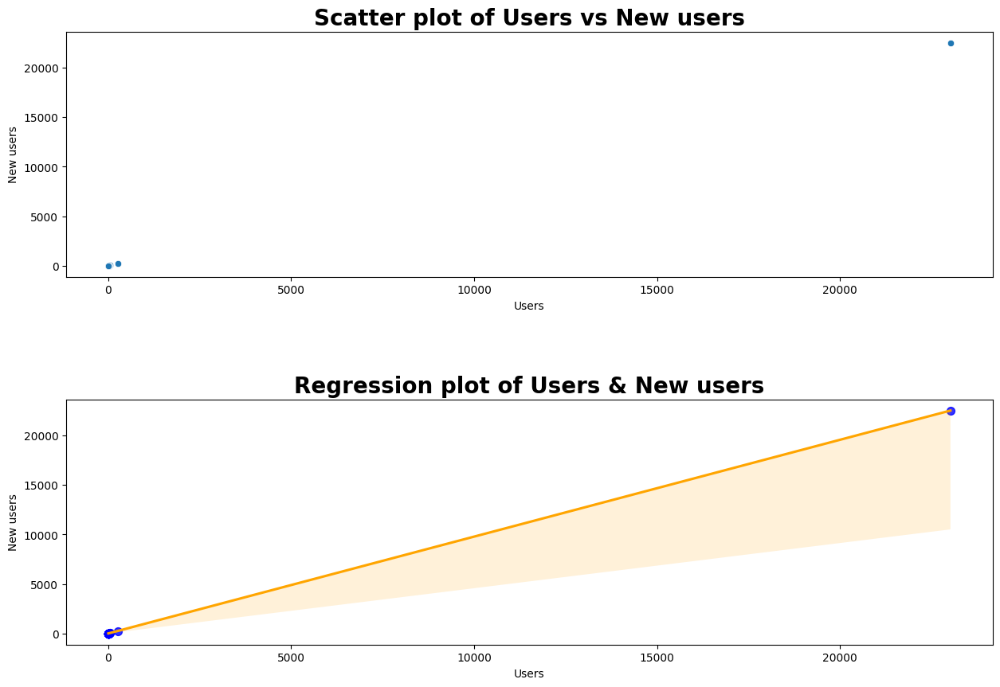

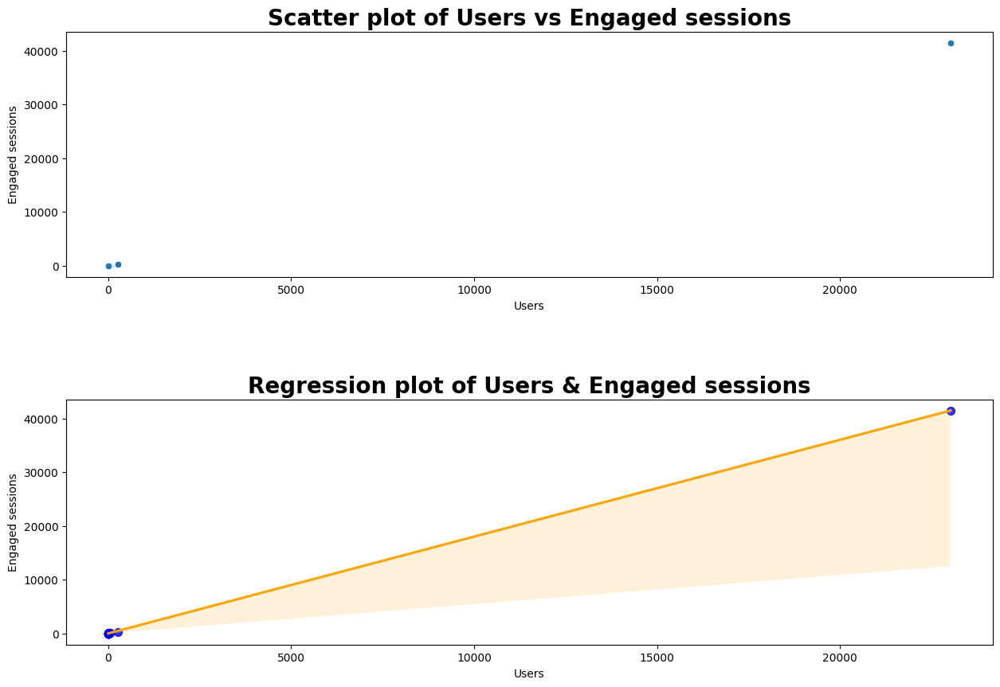

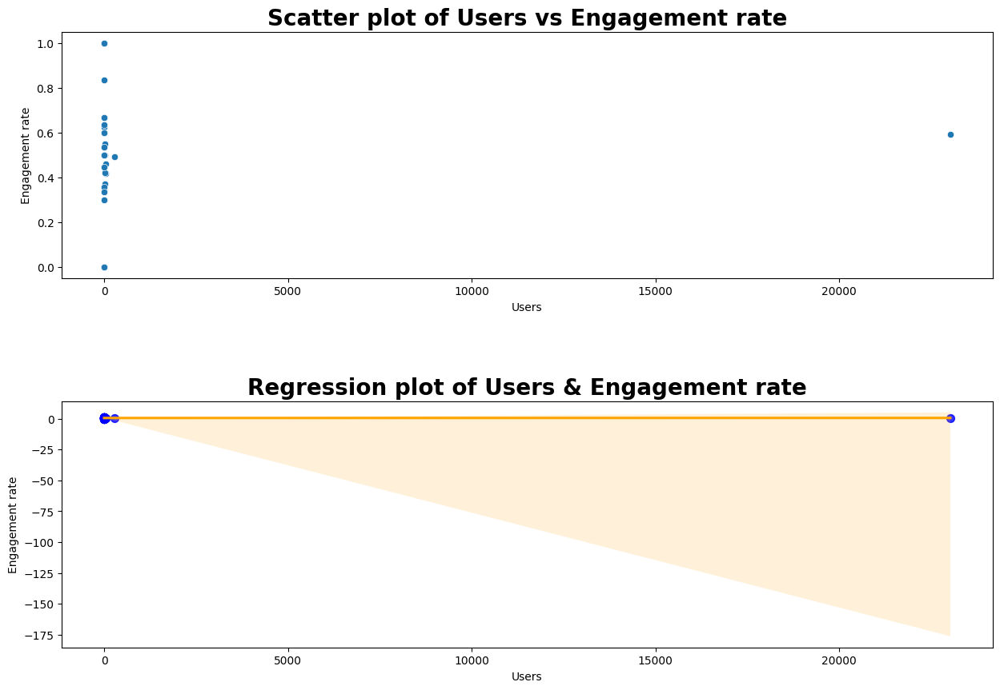

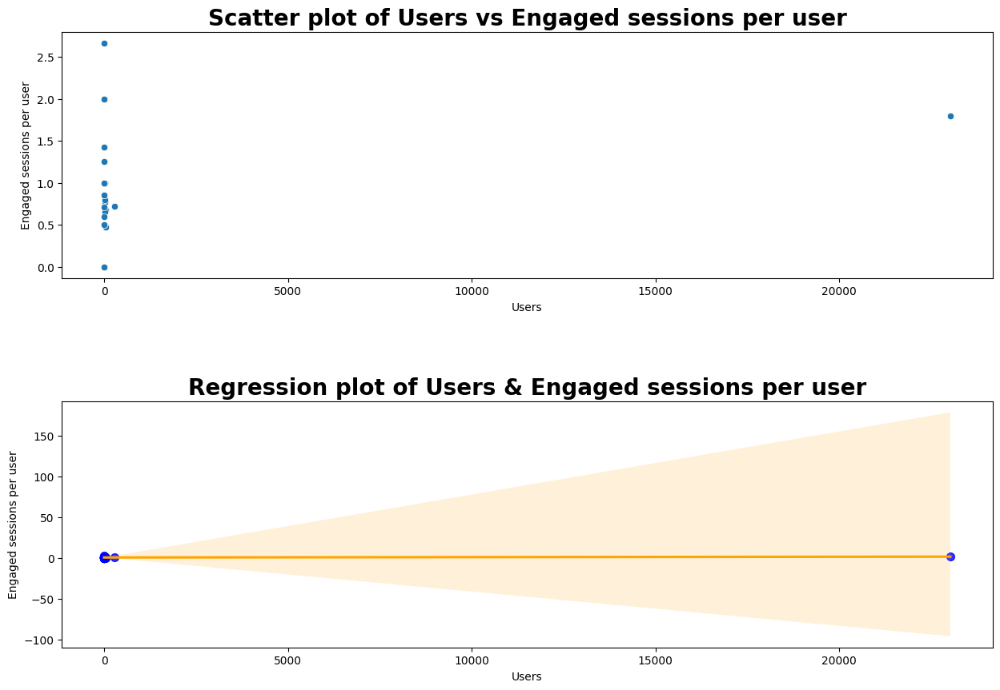

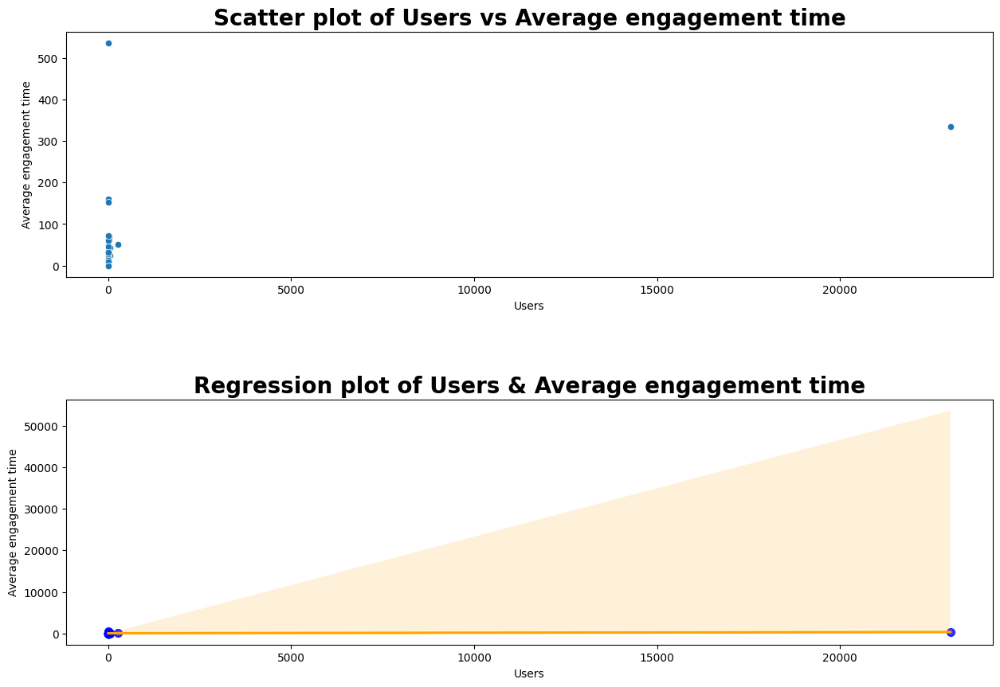

...

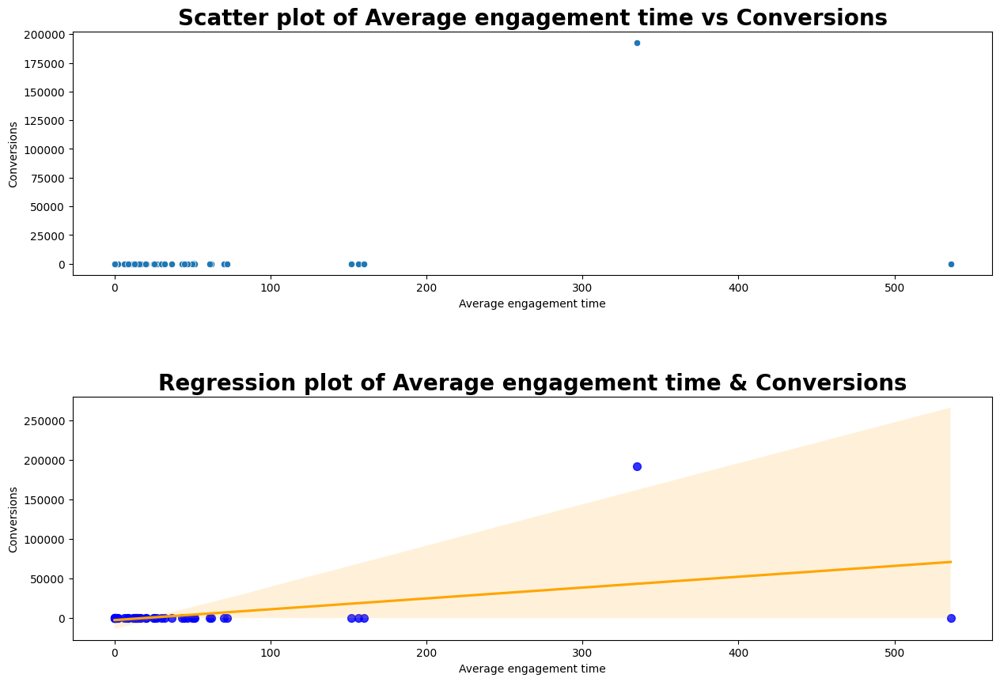

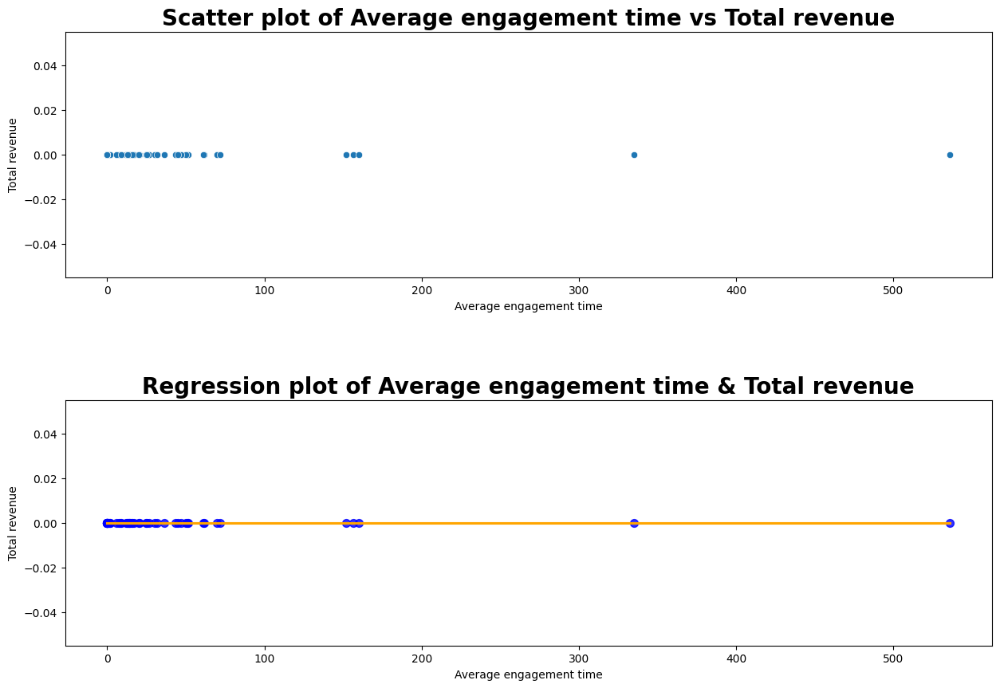

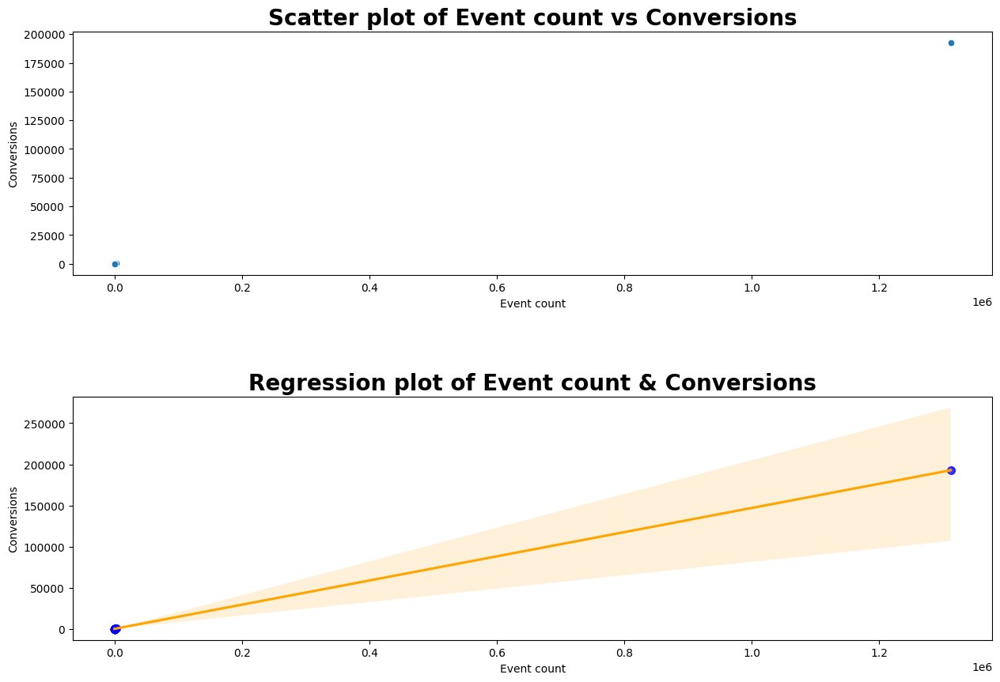

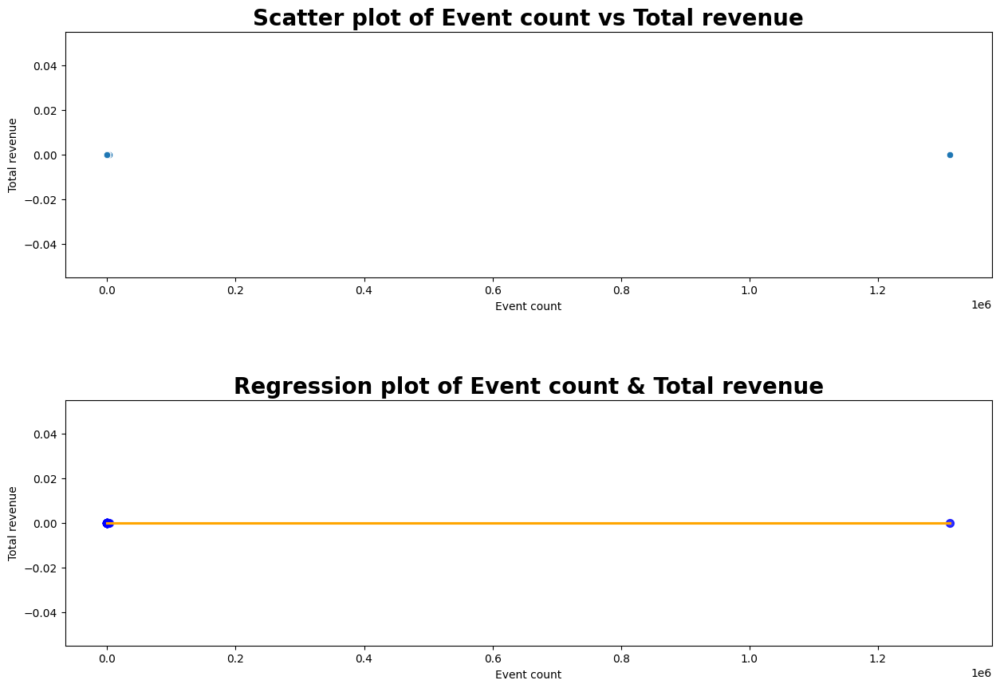

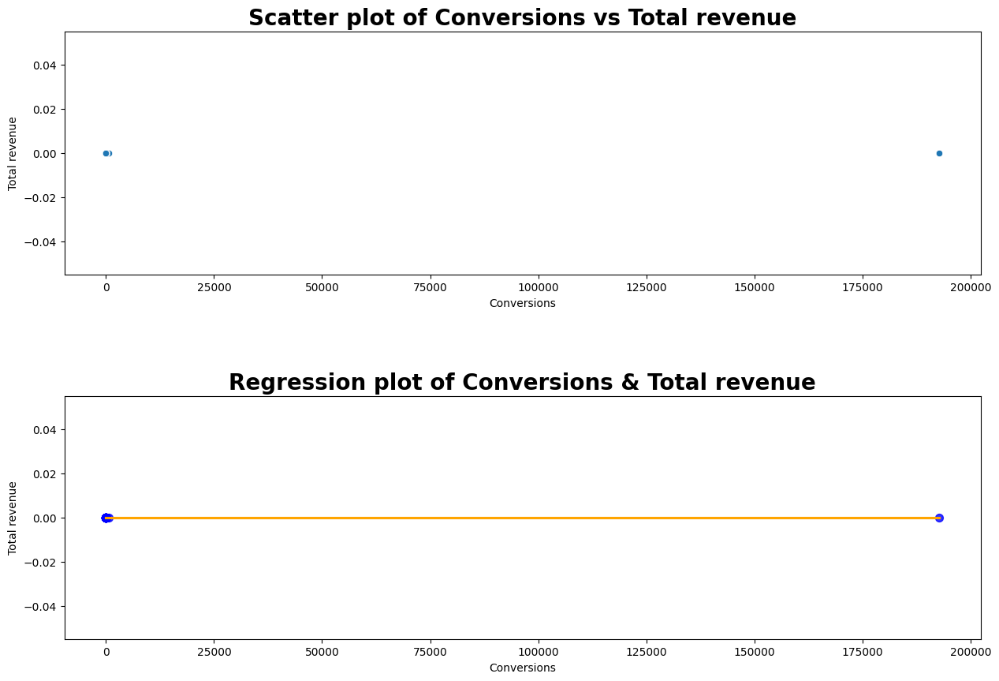

In [78]:
for x in combis:
  scatter_and_reg_plots(data_demographics,x[0],x[1])

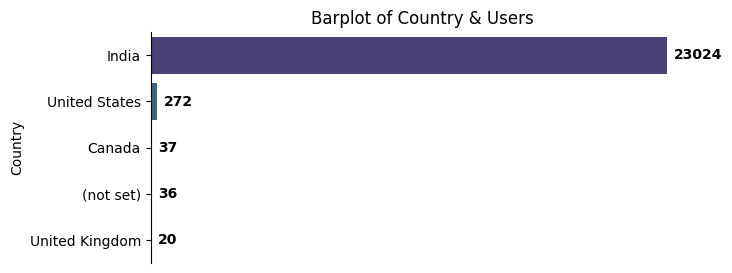

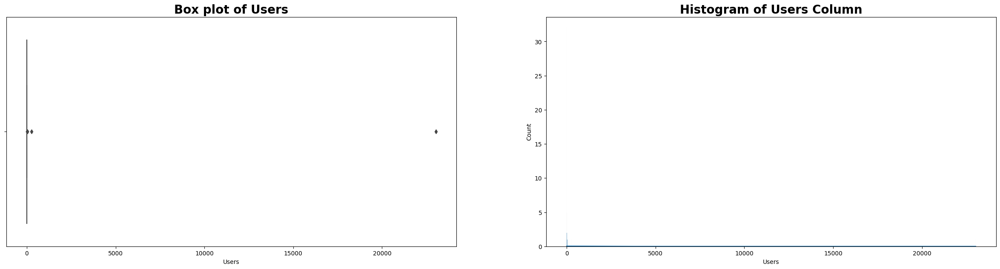

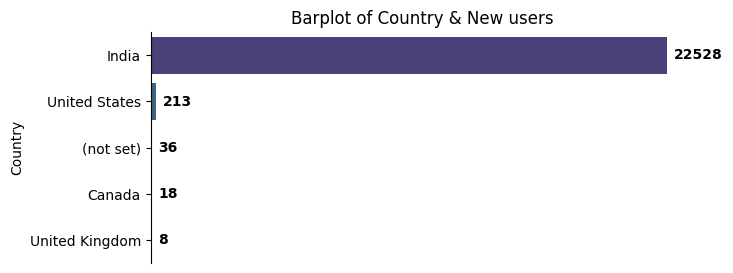

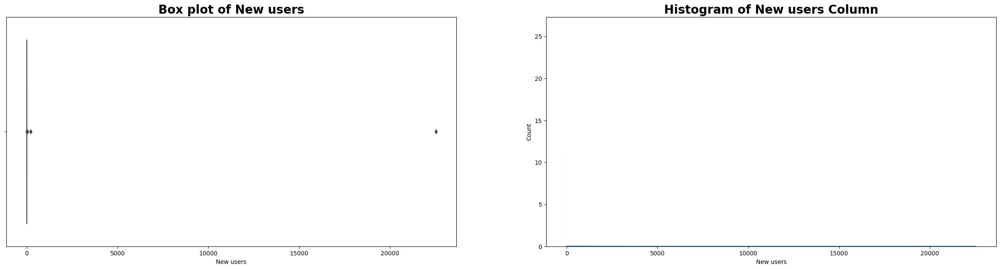

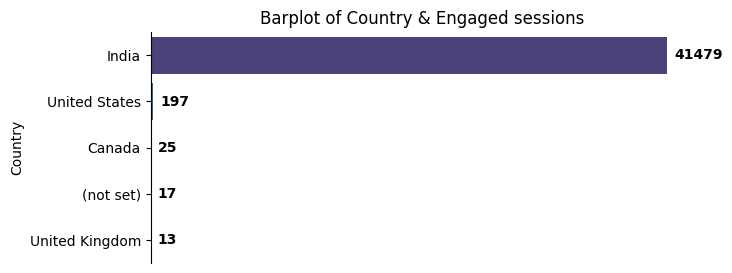

...

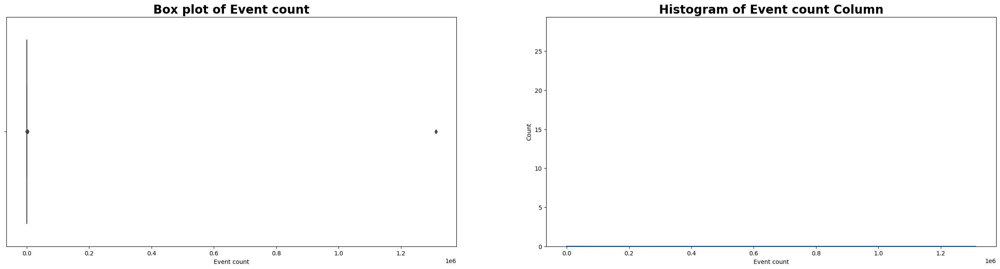

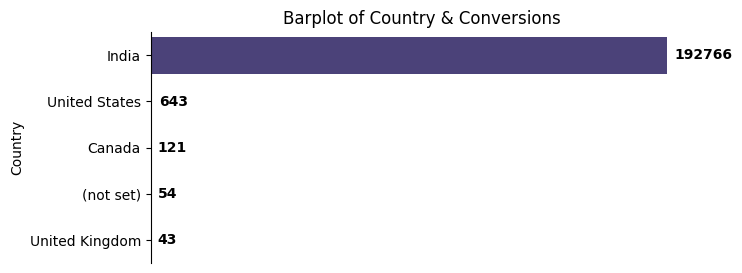

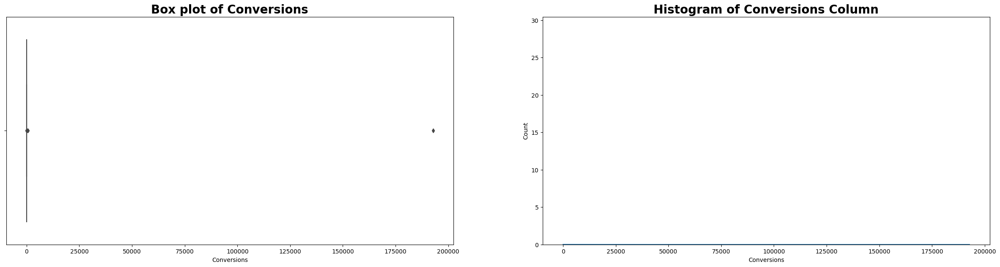

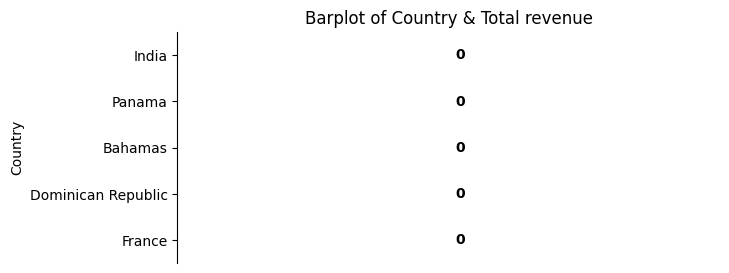

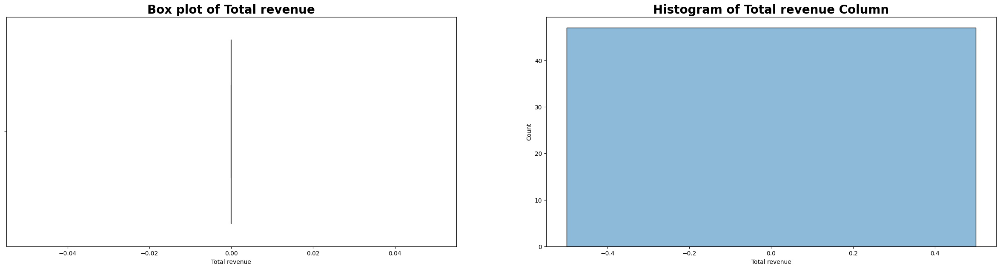

In [79]:
for x in numeric_cols:

  dat=data_demographics.sort_values(by=x,ascending=False).head()
  y=dat.select_dtypes(include='object').columns

  plt.figure(figsize=(7,3))
  plt.title(f'Barplot of {cat_cols[0]} & {x}')
  fig=sns.barplot(data=dat,x=x,y=y[0],palette='viridis')
  fig.bar_label(fig.containers[0],fontweight='bold',padding=5)       # Setting bar labels
  fig.spines[['right','top','bottom']].set_visible(False)            # Removing the chart junk
  fig.xaxis.set_visible(False)                                       # Hiding the x-axis
  plt.show()
  hist_and_box_plots(data_demographics,x)
  plt.show()


**There are outliers in Users, New users, Engaged sessions, Engaged sessions per user, Average engagement time, Event count and Conversions.**

In [80]:
correlation_matrix=data_demographics[numeric_cols[:-1]].corr()
correlation_matrix

,Users,New users,Engaged sessions,Engagement rate,Engaged sessions per user,Average engagement time,Event count,Conversions
Users,1.000000,0.999997,0.999975,0.012727,0.253096,0.456856,0.999955,0.999964
New users,0.999997,1.000000,0.999988,0.012950,0.253141,0.456841,0.999975,0.999981
Engaged sessions,0.999975,0.999988,1.000000,0.013110,0.253468,0.456710,0.999997,0.999999
Engagement rate,0.012727,0.012950,0.013110,1.000000,0.629911,0.124109,0.013168,0.013094
Engaged sessions per user,0.253096,0.253141,0.253468,0.629911,1.000000,0.294999,0.253441,0.253361
Average engagement time,0.456856,0.456841,0.456710,0.124109,0.294999,1.000000,0.456871,0.456638
Event count,0.999955,0.999975,0.999997,0.013168,0.253441,0.456871,1.000000,0.999999
Conversions,0.999964,0.999981,0.999999,0.013094,0.253361,0.456638,0.999999,1.000000


<Axes: title={'center': 'Heatmap of correlation score of columns in Demographics Report'}>

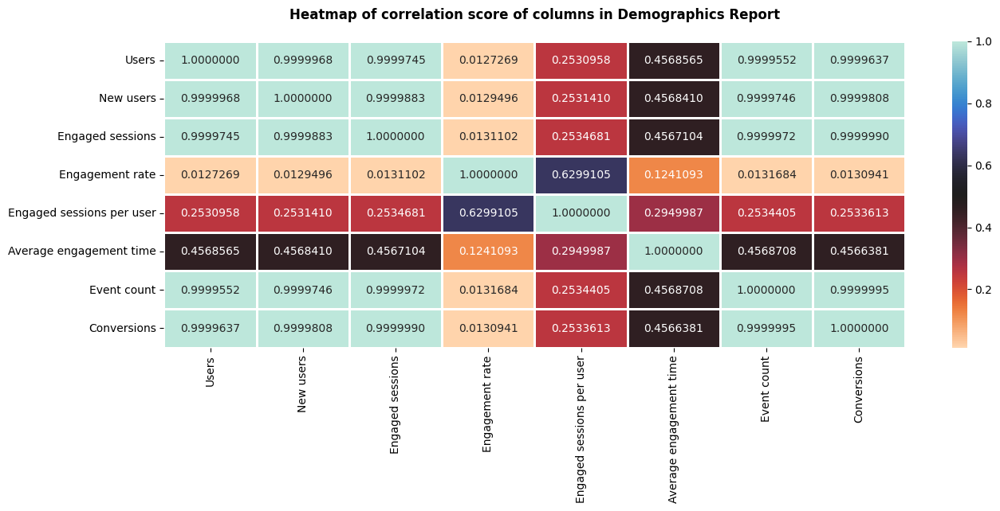

In [81]:
plt.figure(figsize=(15,5))
plt.title("Heatmap of correlation score of columns in Demographics Report",pad=20,fontweight='bold')
sns.heatmap(data=correlation_matrix,annot=True,fmt=".7f",cmap='icefire_r',linewidths=1)

**Good correlation score is observed between Users & New users, Users & Engaged sessions, Users & Event count, Users & Conversions, New users & Engaged sessions, New users & Event count, New users & Conversions and Event count & Conversions.**

### 10. Citywise Report

In [82]:
data_city_report=pd.read_excel("Promilo_BA.xlsx",sheet_name="Citywise Report")
data_city_report.head()

,Town/City,Users,New users,Engaged sessions,Engagement rate,Engaged sessions per user,Average engagement time,Event count,Conversions,Total revenue
0,Bengaluru,6097,5685,15013,0.769385,2.462359,762.20550,607200,62939,0
1,Patna,1594,1467,2127,0.440646,1.334379,98.22208,38830,6980,0
2,Hyderabad,1038,920,1578,0.569264,1.520231,243.69080,96826,34103,0
3,Indore,983,915,1241,0.426460,1.262462,67.89115,21383,4121,0
4,Lucknow,897,839,1125,0.450180,1.254181,83.40580,21041,3650,0


In [83]:
data_city_report.shape

(574, 10)

In [84]:
data_city_report.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 574 entries, 0 to 573
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Town/City                  574 non-null    object 
 1   Users                      574 non-null    int64  
 2   New users                  574 non-null    int64  
 3   Engaged sessions           574 non-null    int64  
 4   Engagement rate            574 non-null    float64
 5   Engaged sessions per user  574 non-null    float64
 6   Average engagement time    574 non-null    float64
 7   Event count                574 non-null    int64  
 8   Conversions                574 non-null    int64  
 9   Total revenue              574 non-null    int64  
dtypes: float64(3), int64(6), object(1)
memory usage: 45.0+ KB


In [85]:
data_city_report.duplicated().sum()

0

In [86]:
data_city_report.describe().T

,count,mean,std,min,25%,50%,75%,max
Users,574.0,46.203833,290.091708,0.0,1.00,2.000000,7.750000,6097.0
New users,574.0,39.846690,267.115856,0.0,1.00,1.000000,5.000000,5685.0
Engaged sessions,574.0,71.613240,656.033770,0.0,1.00,2.000000,7.000000,15013.0
Engagement rate,574.0,0.489662,0.341660,0.0,0.25,0.497547,0.724026,1.0
Engaged sessions per user,574.0,0.884915,0.750856,0.0,0.50,1.000000,1.000000,7.0
Average engagement time,574.0,94.093768,202.850678,0.0,7.00,27.500000,98.402298,2721.0
Event count,574.0,2297.088850,26179.153773,1.0,10.00,35.000000,162.750000,607200.0
Conversions,574.0,337.829268,3074.301547,0.0,2.00,5.000000,23.000000,62939.0
Total revenue,574.0,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.0


In [87]:
numeric_cols,cat_cols=columns(data_city_report)
combis=list(combinations(numeric_cols,2))
combis

[('Users', 'New users'),
 ('Users', 'Engaged sessions'),
 ('Users', 'Engagement rate'),
 ('Users', 'Engaged sessions per user'),
 ('Users', 'Average engagement time'),
 ('Users', 'Event count'),
 ('Users', 'Conversions'),
 ('Users', 'Total revenue'),
 ('New users', 'Engaged sessions'),
 ('New users', 'Engagement rate'),
 ('New users', 'Engaged sessions per user'),
 ('New users', 'Average engagement time'),
 ('New users', 'Event count'),
 ('New users', 'Conversions'),
 ('New users', 'Total revenue'),
 ('Engaged sessions', 'Engagement rate'),
 ('Engaged sessions', 'Engaged sessions per user'),
 ('Engaged sessions', 'Average engagement time'),
 ('Engaged sessions', 'Event count'),
 ('Engaged sessions', 'Conversions'),
 ('Engaged sessions', 'Total revenue'),
 ('Engagement rate', 'Engaged sessions per user'),
 ('Engagement rate', 'Average engagement time'),
 ('Engagement rate', 'Event count'),
 ('Engagement rate', 'Conversions'),
 ('Engagement rate', 'Total revenue'),
 ('Engaged sessions pe

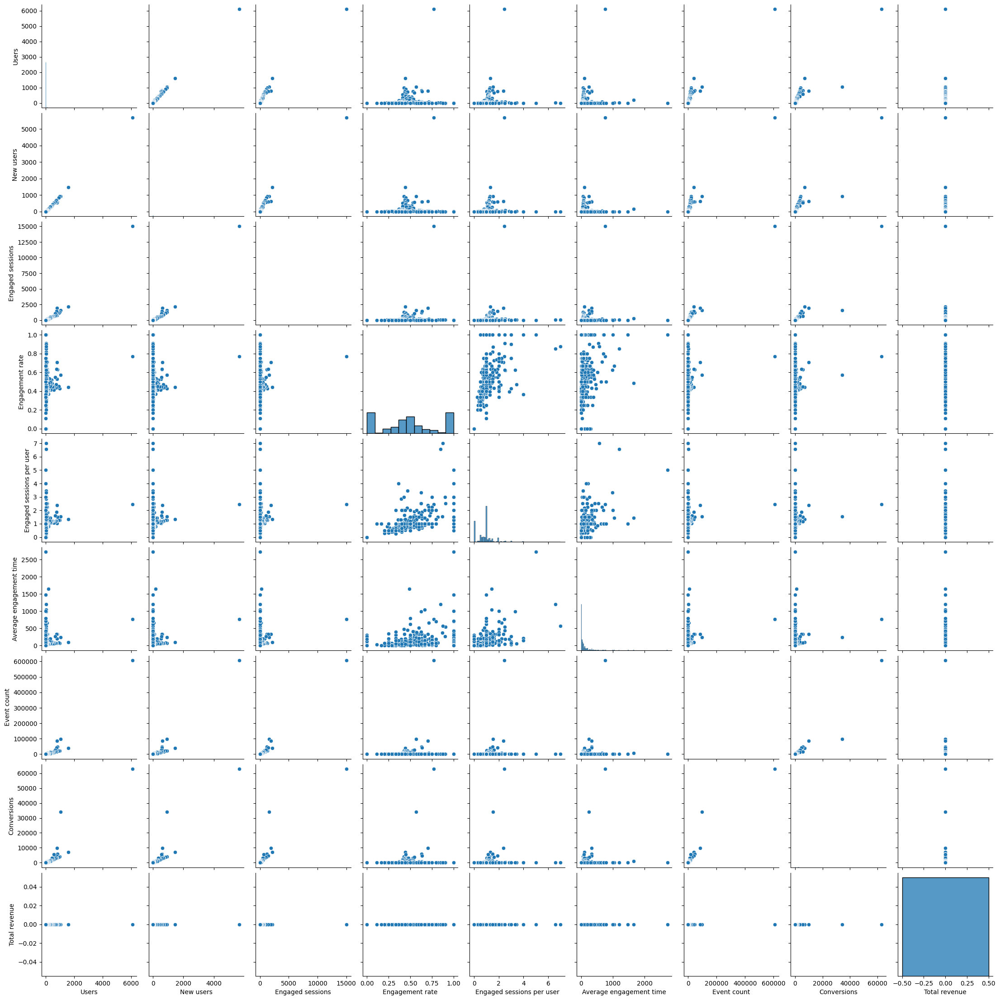

In [88]:
sns.pairplot(data=data_city_report)

<Axes: xlabel='Users', ylabel='Average engagement time'>

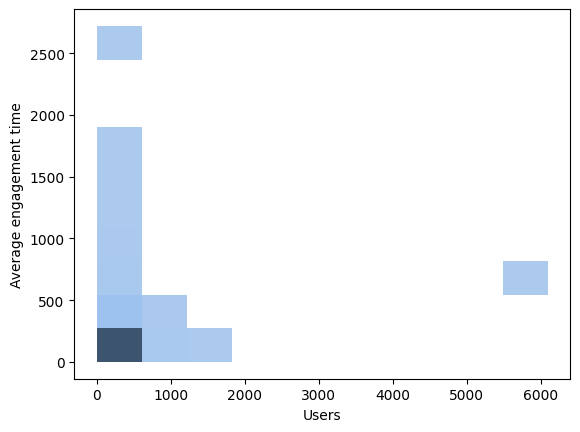

In [126]:
sns.histplot(data=data_city_report,x='Users',bins=10,y='Average engagement time')

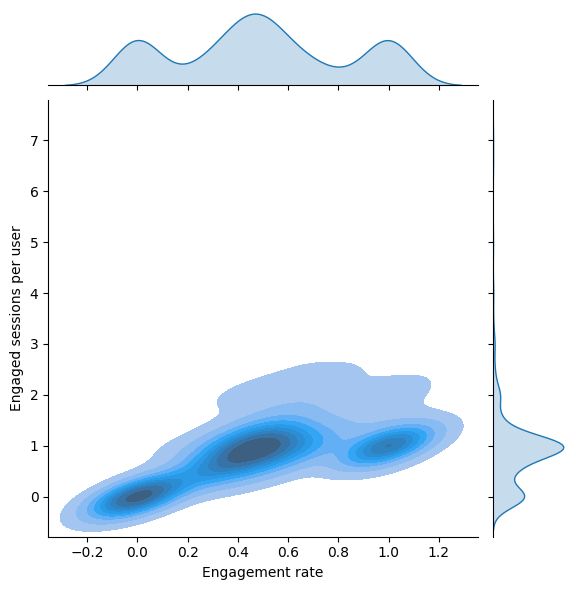

In [133]:
sns.jointplot(data=data_city_report,x='Engagement rate',y='Engaged sessions per user',kind='kde',fill=True)

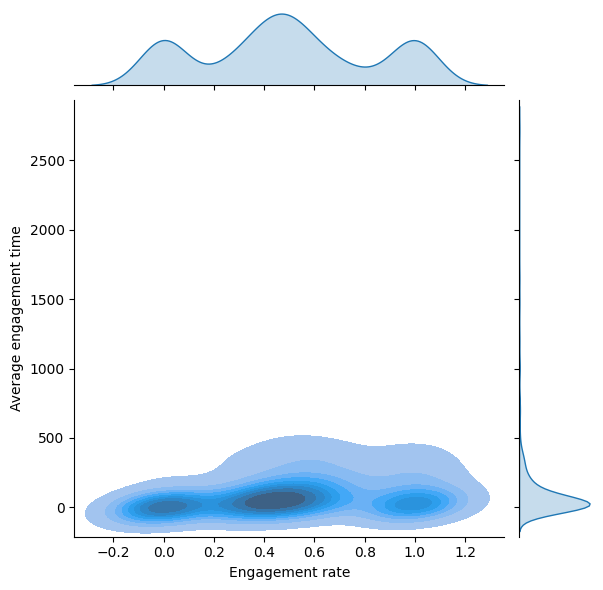

In [134]:
sns.jointplot(data=data_city_report,x='Engagement rate',y='Average engagement time',kind='kde',fill=True)


<Axes: xlabel='Engagement rate', ylabel='Proportion'>

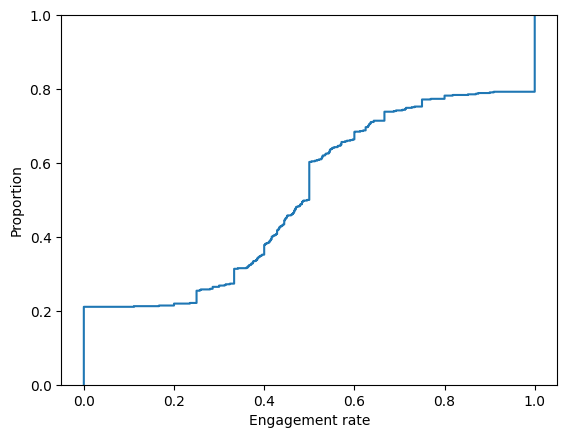

In [136]:
sns.ecdfplot(data=data_city_report,x='Engagement rate')